In [8]:
import glob
import os
import numpy as np
import pandas as pd
import scipy.signal
import skimage
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

ip =  1

plt.style.use('styleNB.mplstyle')
f_dir = '../../data/'

In [15]:
filelist = glob.glob('../../data/processed_tracking/20250403_keratocytes_KOfish_tracking//*.csv')
print(filelist)

['../../data/processed_tracking/20250403_keratocytes_KOfish_tracking/20250403_p63-LifeAct_Oslo_Precision_slideA_prep2_1_MMStack_Pos9_tracking.csv', '../../data/processed_tracking/20250403_keratocytes_KOfish_tracking/20250403_p63-LifeAct_Keithley_slideA_run1_1_MMStack_Pos10_tracking.csv', '../../data/processed_tracking/20250403_keratocytes_KOfish_tracking/20250403_p63-LifeAct_Keithley_slideA_run1_1_MMStack_Pos5_tracking.csv', '../../data/processed_tracking/20250403_keratocytes_KOfish_tracking/20250403_p63-LifeAct_Oslo_Precision_slideB_prep1_1_MMStack_Pos1_tracking.csv', '../../data/processed_tracking/20250403_keratocytes_KOfish_tracking/20250403_p63-LifeAct_Keithley_slideA_run1_1_MMStack_Pos2_tracking.csv', '../../data/processed_tracking/20250403_keratocytes_KOfish_tracking/20250403_p63-LifeAct_Oslo_Precision_slideB_prep1_1_MMStack_Pos10_tracking.csv', '../../data/processed_tracking/20250403_keratocytes_KOfish_tracking/20250403_p63-LifeAct_Keithley_slideA_run1_1_MMStack_Pos11_tracking.c

In [16]:
df = pd.DataFrame()

for file in filelist:

    df_temp = pd.read_csv(file, skiprows=[0,2,3,4])
    df_temp = df_temp[['Track ID', 'Frame', 'X', 'Y', 'Z']]
    df_temp.columns = ['cell', 'frame', 'x', 'y', 'z']

    if '20250403_p63-LifeAct_Keithley_slideA_run1_1_MMStack' in file:
        df_temp['celltype'] = 'zebrafish_slideA'
        df_temp['trial'] = 0

        df_temp['position'] = int(file.split('Pos')[1].split('_')[0])
        df_temp['date'] = '20250403'
        
        df_temp['acqtime'] = '60sec'
        df_temp['material'] = 'Ibidi_treat'
        df_temp['concentration'] = ' '
        df_temp['scope'] = 'Rio'
        df_temp['magnification'] = '20xAir'    
        df_temp['media'] = ' '
        df_temp['analysis_date'] = '20250406'
        df_temp['user'] = 'AP'
        df_temp['filename'] = file


    if '20250403_p63-LifeAct_Keithley_slideB_run2_1_MMStack' in file:
        df_temp['celltype'] = 'zebrafish_slideB'
        df_temp['trial'] = 1

        df_temp['position'] = int(file.split('Pos')[1].split('_')[0])
        df_temp['date'] = '20250403'
        
        df_temp['acqtime'] = '60sec'
        df_temp['material'] = 'Ibidi_treat'
        df_temp['concentration'] = ' '
        df_temp['scope'] = 'Rio'
        df_temp['magnification'] = '20xAir'    
        df_temp['media'] = ' '
        df_temp['analysis_date'] = '20250406'
        df_temp['user'] = 'AP'
        df_temp['filename'] = file

    if '20250403_p63-LifeAct_Oslo_Precision_slideB_prep1_1_MMStack' in file:
        df_temp['celltype'] = 'zebrafish_slideB'
        df_temp['trial'] = 0

        df_temp['position'] = int(file.split('Pos')[1].split('_')[0])
        df_temp['date'] = '20250403'
        
        df_temp['acqtime'] = '60sec'
        df_temp['material'] = 'Ibidi_treat'
        df_temp['concentration'] = ' '
        df_temp['scope'] = 'Oslo'
        df_temp['magnification'] = '20xAir'    
        df_temp['media'] = ' '
        df_temp['analysis_date'] = '20250406'
        df_temp['user'] = 'NB'
        df_temp['filename'] = file

    if '20250403_p63-LifeAct_Oslo_Precision_slideA_prep2_1_MMStack' in file:
        df_temp['celltype'] = 'zebrafish_slideA'
        df_temp['trial'] = 1

        df_temp['position'] = int(file.split('Pos')[1].split('_')[0])
        df_temp['date'] = '20250403'
        
        df_temp['acqtime'] = '60sec'
        df_temp['material'] = 'Ibidi_treat'
        df_temp['concentration'] = ' '
        df_temp['scope'] = 'Oslo'
        df_temp['magnification'] = '20xAir'    
        df_temp['media'] = ' '
        df_temp['analysis_date'] = '20250406'
        df_temp['user'] = 'NB'
        df_temp['filename'] = file
        
        
    df = pd.concat([df, df_temp], ignore_index = True)




In [17]:
df.head()

,cell,frame,x,y,z,celltype,trial,position,date,acqtime,material,concentration,scope,magnification,media,analysis_date,user,filename
0,0,145,941.600486,28.491524,0.0,zebrafish_slideA,1,9,20250403,60sec,Ibidi_treat,,Oslo,20xAir,,20250406,NB,../../data/processed_tracking/20250403_keratoc...
1,0,4,941.915103,20.612540,0.0,zebrafish_slideA,1,9,20250403,60sec,Ibidi_treat,,Oslo,20xAir,,20250406,NB,../../data/processed_tracking/20250403_keratoc...
2,0,120,943.245899,17.944608,0.0,zebrafish_slideA,1,9,20250403,60sec,Ibidi_treat,,Oslo,20xAir,,20250406,NB,../../data/processed_tracking/20250403_keratoc...
3,0,107,945.098023,19.023091,0.0,zebrafish_slideA,1,9,20250403,60sec,Ibidi_treat,,Oslo,20xAir,,20250406,NB,../../data/processed_tracking/20250403_keratoc...
4,0,115,942.996386,18.485782,0.0,zebrafish_slideA,1,9,20250403,60sec,Ibidi_treat,,Oslo,20xAir,,20250406,NB,../../data/processed_tracking/20250403_keratoc...


In [18]:
df_0 = df[df.frame<30]
df_0['E_V_cm'] = 0

df_100 = df[df.frame<60]
df_100 = df_100[df_100.frame>=30]
df_100.frame = df_100.frame - df_100.frame.min()
df_100['E_V_cm'] = 1

df_300 = df[df.frame<110]
df_300 = df_300[df_300.frame>=80]
df_300.frame = df_300.frame - df_300.frame.min()
df_300['E_V_cm'] = 3

df_500 = df[df.frame<=df.frame.max()]
df_500 = df_500[df_500.frame>=130]
df_500.frame = df_500.frame - df_500.frame.min()
df_500['E_V_cm'] = 5

df = pd.concat([df_0, df_100, df_300, df_500], ignore_index=True)


/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_33385/2577295440.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_0['E_V_cm'] = 0


In [19]:
df_groups = df.groupby(['celltype', 'E_V_cm', 'trial', 'date', 'position','user'])
for i, data in df_groups:
    print(i)

('zebrafish_slideA', np.int64(0), np.int64(0), '20250403', np.int64(0), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250403', np.int64(1), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250403', np.int64(2), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250403', np.int64(3), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250403', np.int64(4), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250403', np.int64(5), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250403', np.int64(6), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250403', np.int64(7), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250403', np.int64(8), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250403', np.int64(9), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250403', np.int64(10), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250403', np.int64(11), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(1), '20250403', np.

In [20]:
df = df[['cell', 'frame', 'x', 'y', 'z', 'celltype', 'position',
      'E_V_cm', 'date', 'trial', 'user']]

In [21]:
# number of cells in data
for sg, d in df.groupby(['celltype', 'E_V_cm', 'date', 'trial', 'position']):
    print(sg)
    print(len(d.frame.unique()))
    
    count = 0
    for g, d_ in d.groupby(['cell']):
        count += 1
    print(count)

('zebrafish_slideA', np.int64(0), '20250403', np.int64(0), np.int64(0))
30
7
('zebrafish_slideA', np.int64(0), '20250403', np.int64(0), np.int64(1))
30
13
('zebrafish_slideA', np.int64(0), '20250403', np.int64(0), np.int64(2))
30
10
('zebrafish_slideA', np.int64(0), '20250403', np.int64(0), np.int64(3))
30
11
('zebrafish_slideA', np.int64(0), '20250403', np.int64(0), np.int64(4))
30
8
('zebrafish_slideA', np.int64(0), '20250403', np.int64(0), np.int64(5))
30
14
('zebrafish_slideA', np.int64(0), '20250403', np.int64(0), np.int64(6))
30
5
('zebrafish_slideA', np.int64(0), '20250403', np.int64(0), np.int64(7))
30
9
('zebrafish_slideA', np.int64(0), '20250403', np.int64(0), np.int64(8))
30
8
('zebrafish_slideA', np.int64(0), '20250403', np.int64(0), np.int64(9))
30
5
('zebrafish_slideA', np.int64(0), '20250403', np.int64(0), np.int64(10))
30
12
('zebrafish_slideA', np.int64(0), '20250403', np.int64(0), np.int64(11))
30
6
('zebrafish_slideA', np.int64(0), '20250403', np.int64(1), np.int64(0

In [22]:
df = df.sort_values(['trial', 'user','celltype', 'position', 'cell','frame'])

df.head()

,cell,frame,x,y,z,celltype,position,E_V_cm,date,trial,user
21677,0,0,804.413621,486.433914,0.0,zebrafish_slideA,0,0,20250403,0,AP
44298,0,0,799.899071,486.621023,0.0,zebrafish_slideA,0,1,20250403,0,AP
66385,0,0,799.147164,486.543962,0.0,zebrafish_slideA,0,3,20250403,0,AP
88005,0,0,798.420553,486.863042,0.0,zebrafish_slideA,0,5,20250403,0,AP
21681,0,1,804.213140,486.315907,0.0,zebrafish_slideA,0,0,20250403,0,AP


In [36]:
np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 0])

np.False_

## Track filtering

## Oslo - zebrafish_slideB (prep 1)

(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(0), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(0), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(0), np.int64(3))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(0), np.int64(5))


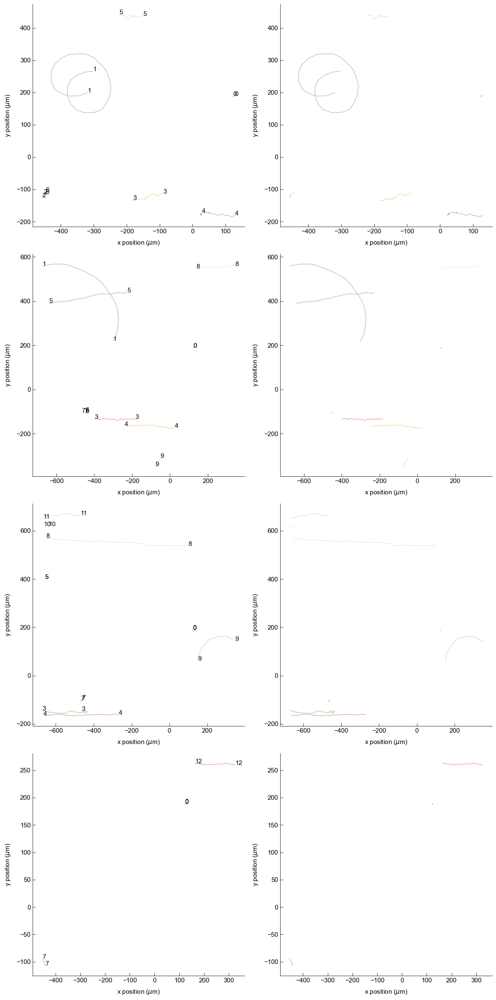

In [22]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 0]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
    
    

            
    plt.tight_layout()


# 0 V/cm : 1
# 1 V/cm : 1
# 3 V/cm : 9
# 5 V/cm : 



In [37]:
# # I'm going to take a simple approach to identify the cells in
# # np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

# f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# # ax = ax.ravel()
    
# for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
#     if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 1]):
#         print(sg)


#         if sg[4] == 0:
#             ind = 0
#         elif sg[4] == 1:
#             ind = 1
#         elif sg[4] == 3:
#             ind = 2
#         elif sg[4] == 5:
#             ind = 3
            
#         aq = 0
#         for g, d_ in d.groupby(['E_V_cm']):
#             #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
#             #print(g)
            
#             ##################################
#             # plot tracks
#             ##################################
#             num_cells = len(d_.cell.unique())
#             for i in d_.cell.unique():
#                 data_ = d_[d_.cell==i]
#                 #if len(data_.frame.unique()) == 31:
    
#                 data_ = data_.replace([np.inf, -np.inf], np.nan)
#                 d_x = data_.x[~np.isnan(data_.x)] 
#                 d_y = data_.y[~np.isnan(data_.y)] 
    
#                 if len(d_x)==0:
#                     continue
    
#                 x = data_.x.values 
#                 y = data_.y.values 
    
#                 for ax_ in [ax[ind,0], ax[ind,1]]:
#                     ax_.plot(data_.x.values - 1024.0*ip, 
#                                    1024.0*ip - data_.y.values)
#                     ax_.set_xlabel(r'x position ($\mu$m)')
#                     ax_.set_ylabel(r'y position ($\mu$m)')
                
#                 ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
#                                             (1024.0*ip - data_.y.values)[0]), 
#                                     xytext=((data_.x.values - 1024.0*ip)[0], 
#                                             (1024.0*ip - data_.y.values)[0]))

#                 ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
#                                             (1024.0*ip - data_.y.values)[-1]), 
#                                     xytext=((data_.x.values - 1024.0*ip)[-1], 
#                                             (1024.0*ip - data_.y.values)[-1]))
    
    
    

            
#     plt.tight_layout()


# # 0 V/cm : 
# # 1 V/cm : 
# # 3 V/cm : 
# # 5 V/cm : 


(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(2), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(2), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(2), np.int64(3))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(2), np.int64(5))


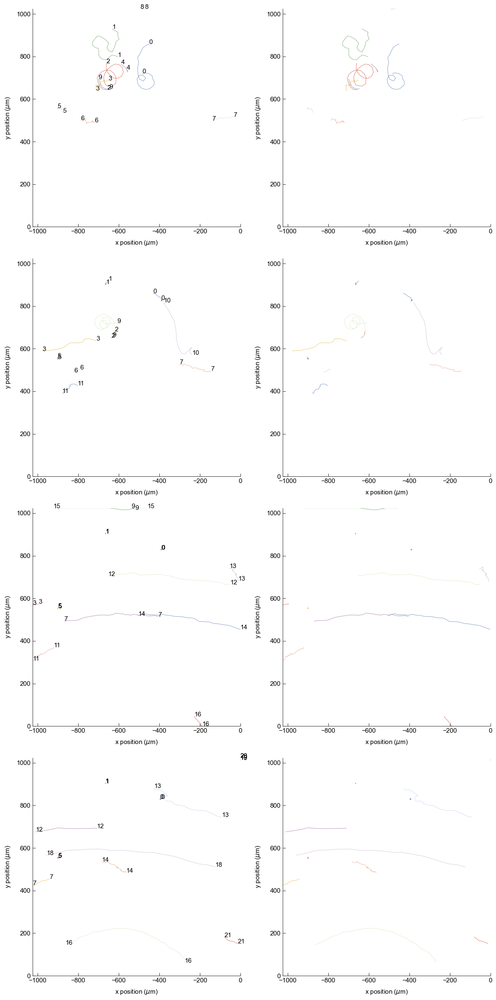

In [31]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 2]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
    
    

            
    plt.tight_layout()


# 0 V/cm : 0, 1, 2
# 1 V/cm : 9, 10
# 3 V/cm : 
# 5 V/cm : 




(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(3), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(3), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(3), np.int64(3))


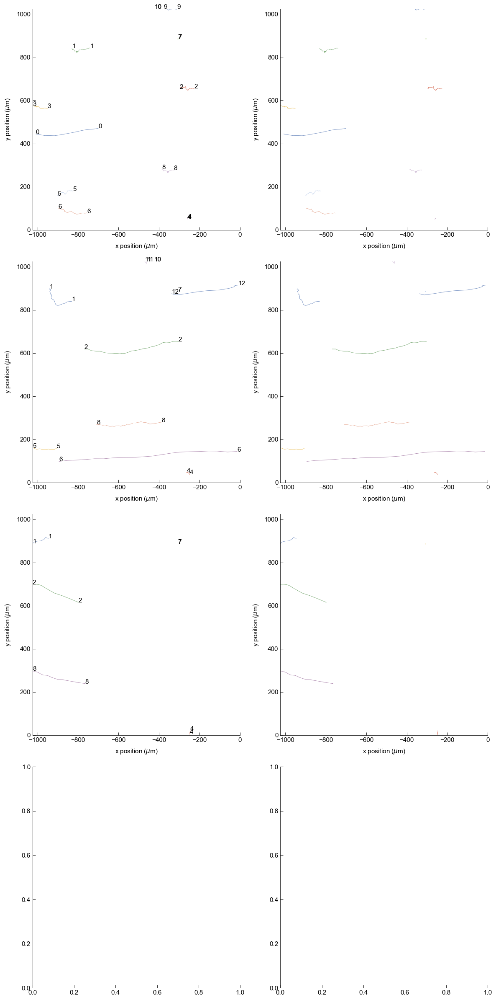

In [32]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 3]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
    
    

            
    plt.tight_layout()


# 0 V/cm : 0
# 1 V/cm : 
# 3 V/cm : 
# 5 V/cm : 




(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(4), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(4), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(4), np.int64(3))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(4), np.int64(5))


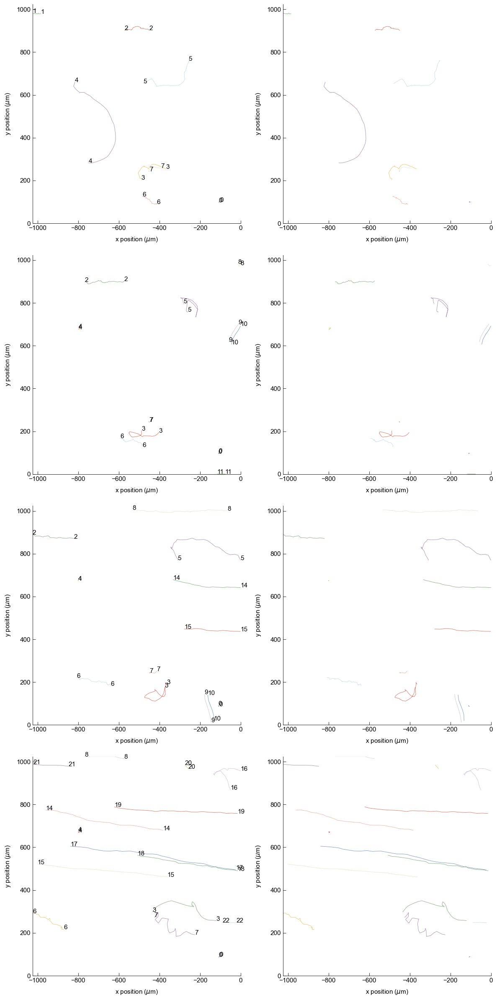

In [35]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 4]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
    
    

            
    plt.tight_layout()


# 0 V/cm : 4
# 1 V/cm : 
# 3 V/cm : 
# 5 V/cm : 7, 3



(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(5), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(5), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(5), np.int64(3))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(5), np.int64(5))


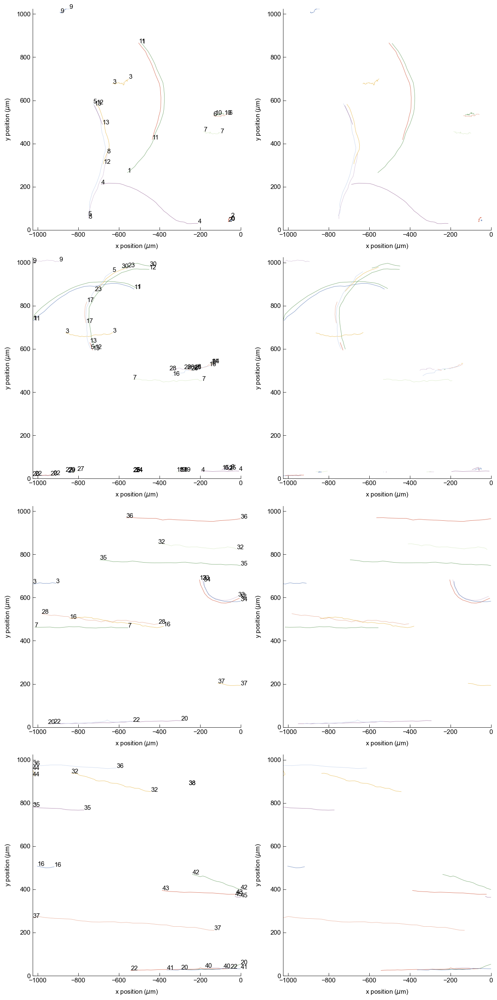

In [36]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 5]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
    
    

            
    plt.tight_layout()


# 0 V/cm : 4, 5, 1
# 1 V/cm : 11, 12
# 3 V/cm : 12
# 5 V/cm : 



(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(6), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(6), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(6), np.int64(3))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(6), np.int64(5))


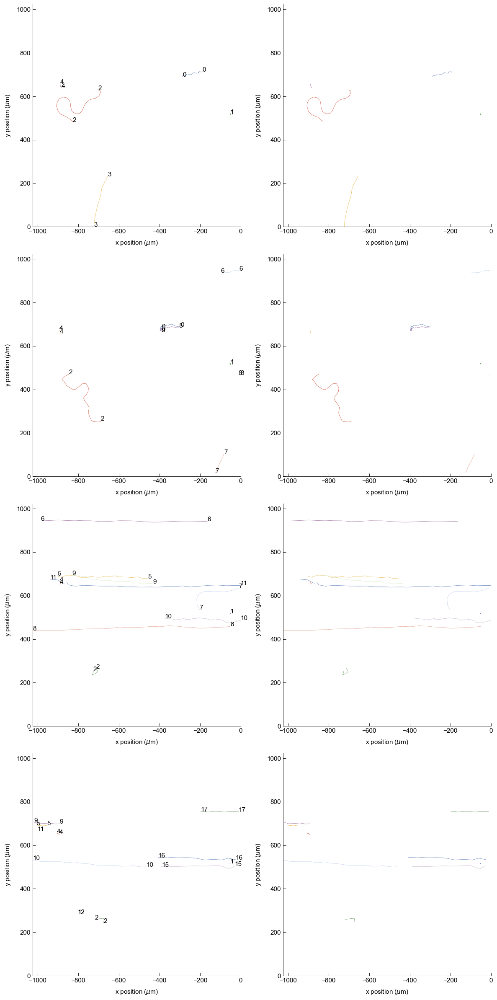

In [38]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 6]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
    
    

            
    plt.tight_layout()


# 0 V/cm : 2, 3
# 1 V/cm : 2
# 3 V/cm : 7
# 5 V/cm :  




(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(7), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(7), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(7), np.int64(3))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(7), np.int64(5))


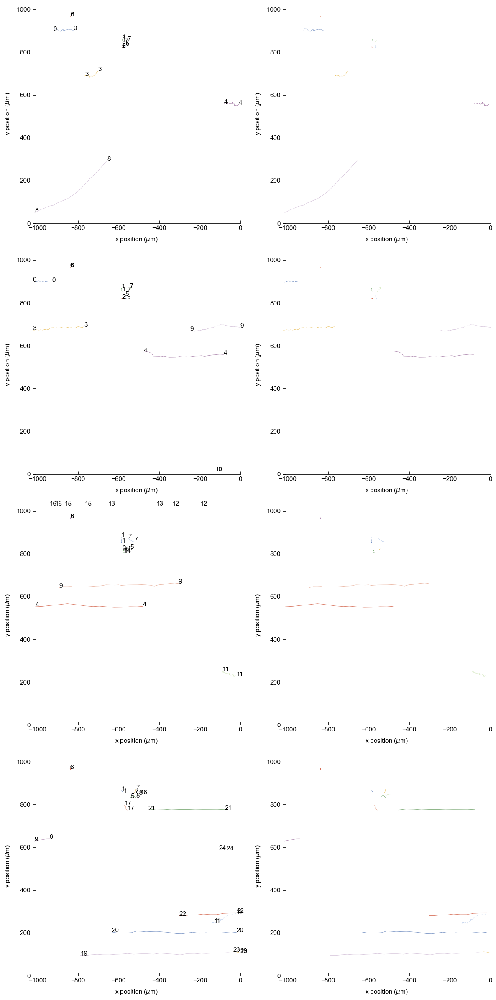

In [10]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 7]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
    
    

            
    plt.tight_layout()


# 0 V/cm : 8
# 1 V/cm : 
# 3 V/cm : 
# 5 V/cm :  



(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(8), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(8), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(8), np.int64(3))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(8), np.int64(5))


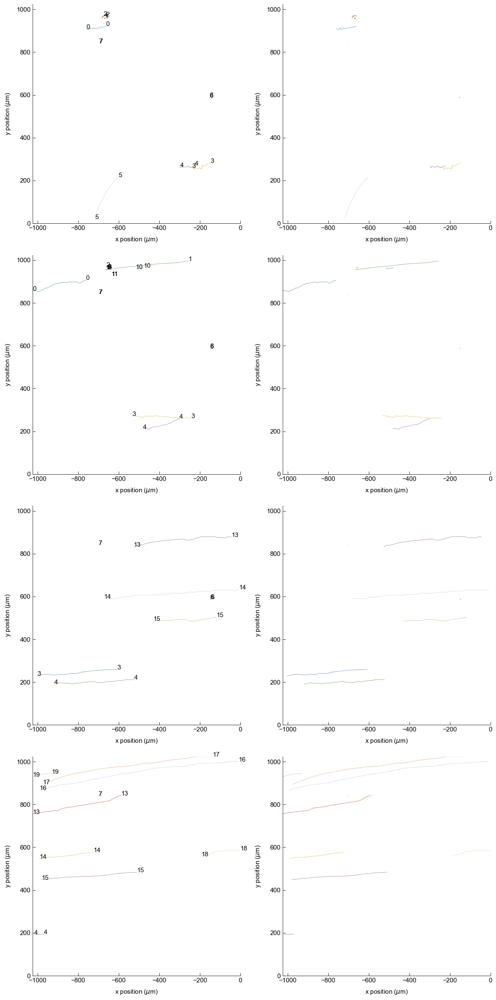

In [11]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 8]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
    
    

            
    plt.tight_layout()


# 0 V/cm : 5
# 1 V/cm : 
# 3 V/cm : 
# 5 V/cm :  



In [13]:
# # I'm going to take a simple approach to identify the cells in
# # np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

# f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# # ax = ax.ravel()
    
# for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
#     if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 9]):
#         print(sg)


#         if sg[4] == 0:
#             ind = 0
#         elif sg[4] == 1:
#             ind = 1
#         elif sg[4] == 3:
#             ind = 2
#         elif sg[4] == 5:
#             ind = 3
            
#         aq = 0
#         for g, d_ in d.groupby(['E_V_cm']):
#             #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
#             #print(g)
            
#             ##################################
#             # plot tracks
#             ##################################
#             num_cells = len(d_.cell.unique())
#             for i in d_.cell.unique():
#                 data_ = d_[d_.cell==i]
#                 #if len(data_.frame.unique()) == 31:
    
#                 data_ = data_.replace([np.inf, -np.inf], np.nan)
#                 d_x = data_.x[~np.isnan(data_.x)] 
#                 d_y = data_.y[~np.isnan(data_.y)] 
    
#                 if len(d_x)==0:
#                     continue
    
#                 x = data_.x.values 
#                 y = data_.y.values 
    
#                 for ax_ in [ax[ind,0], ax[ind,1]]:
#                     ax_.plot(data_.x.values - 1024.0*ip, 
#                                    1024.0*ip - data_.y.values)
#                     ax_.set_xlabel(r'x position ($\mu$m)')
#                     ax_.set_ylabel(r'y position ($\mu$m)')
#                     ax_.set_xlim(-1024.0*ip, 0)
#                     ax_.set_ylim(0,1024.0*ip)
                
#                 ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
#                                             (1024.0*ip - data_.y.values)[0]), 
#                                     xytext=((data_.x.values - 1024.0*ip)[0], 
#                                             (1024.0*ip - data_.y.values)[0]))

#                 ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
#                                             (1024.0*ip - data_.y.values)[-1]), 
#                                     xytext=((data_.x.values - 1024.0*ip)[-1], 
#                                             (1024.0*ip - data_.y.values)[-1]))
    
    
    

            
#     plt.tight_layout()


# # 0 V/cm : 
# # 1 V/cm : 
# # 3 V/cm : 
# # 5 V/cm :  




(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(11), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(11), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(11), np.int64(3))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(11), np.int64(5))


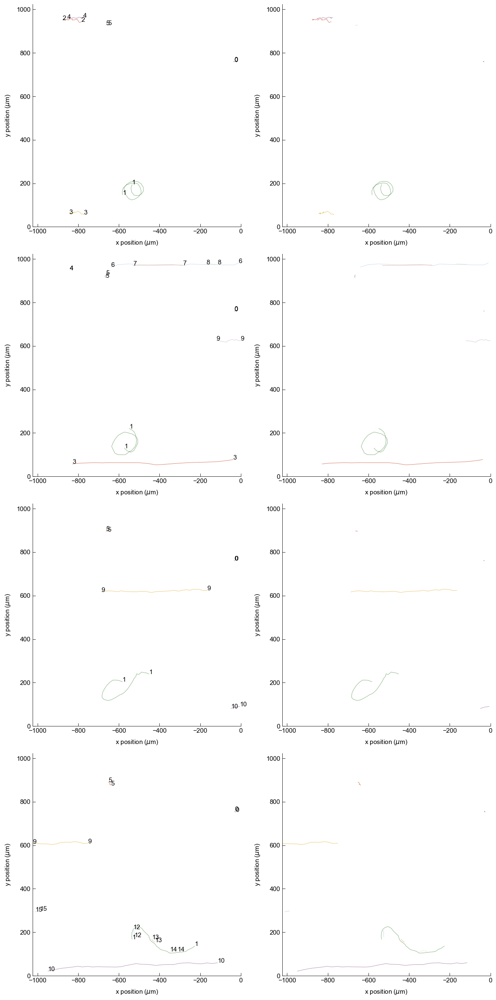

In [88]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):

    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 11]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
    
    

            
    plt.tight_layout()


# 0 V/cm : 1
# 1 V/cm : 1
# 3 V/cm : 1
# 5 V/cm :  1


## Oslo - zebrafish_slideA (prep 2)

In [49]:
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if sg[1] == 'NB':
        print(sg)

(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(0), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(0), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(0), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(0), np.int64(5))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(1), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(1), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(1), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(1), np.int64(5))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(2), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(2), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(2), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(2), np.int64(5))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(4), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(4), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(4), np.int64(3))
(np.int64(

(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(0), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(0), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(0), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(0), np.int64(5))


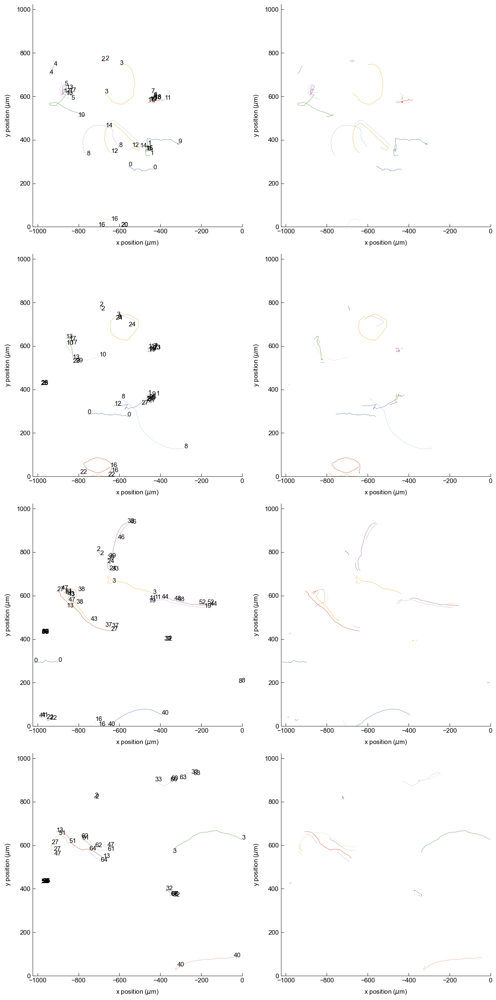

In [50]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):

    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 0]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
    
    

            
    plt.tight_layout()


# 0 V/cm : 10, 5, 8, 3, 12, 3
# 1 V/cm : 8, 12, 10, 3, 16
# 3 V/cm : 40, 3, 19, 33
# 5 V/cm :  3, 40, 27




(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(1), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(1), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(1), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(1), np.int64(5))


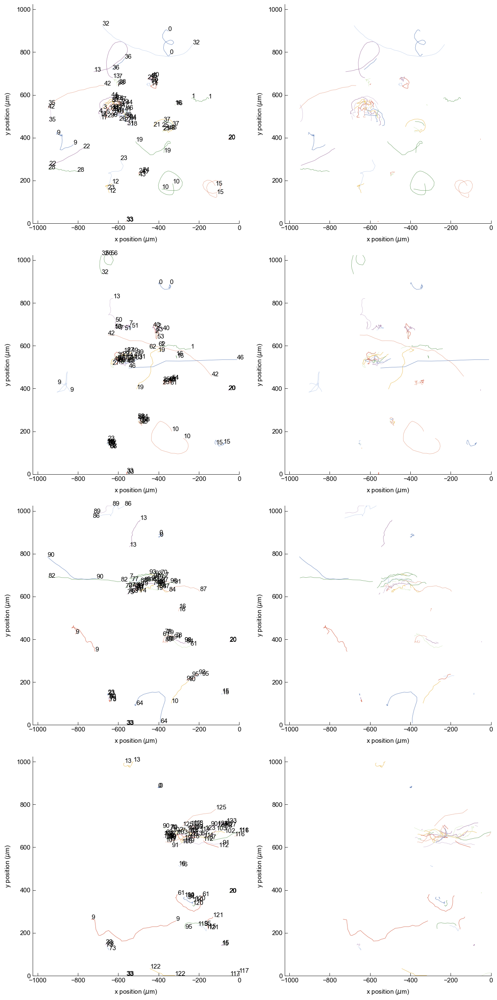

In [89]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 1]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 13, 35, 22, 0, 32, 13, 10, 23, 19
# 1 V/cm : 19, 9, 10, 42, 
# 3 V/cm : 90, 13, 64, 10, 
# 5 V/cm :  9, 111, 


# 0 V/cm : 
# 1 V/cm : 
# 3 V/cm : 
# 5 V/cm : 


(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(2), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(2), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(2), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(2), np.int64(5))


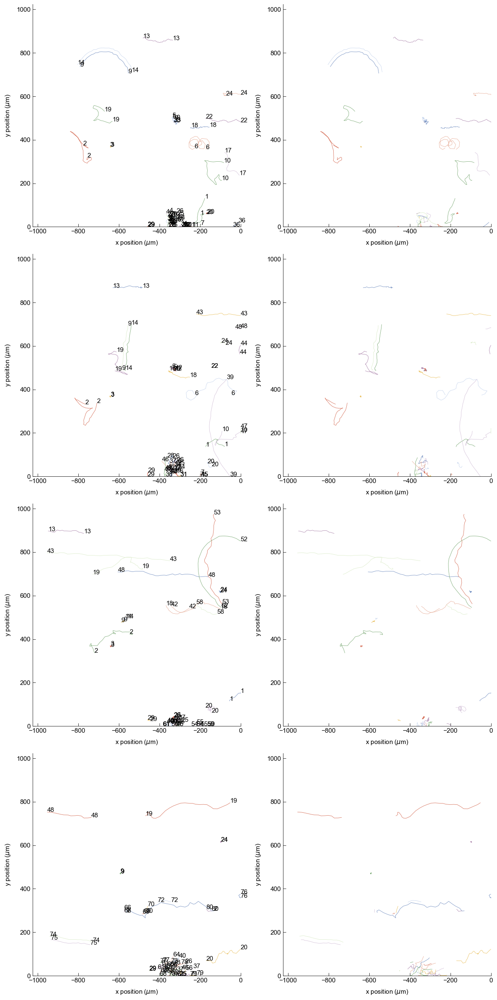

In [95]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 2]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 14, 19, 2, 6, 10, 1, 17
# 1 V/cm : 2, 19, 14, 39, 6, 1, 10
# 3 V/cm : 19, 52, 53, 2, 18, 
# 5 V/cm :  75, 2, 19, 20, 




(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(3), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(3), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(3), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(3), np.int64(5))


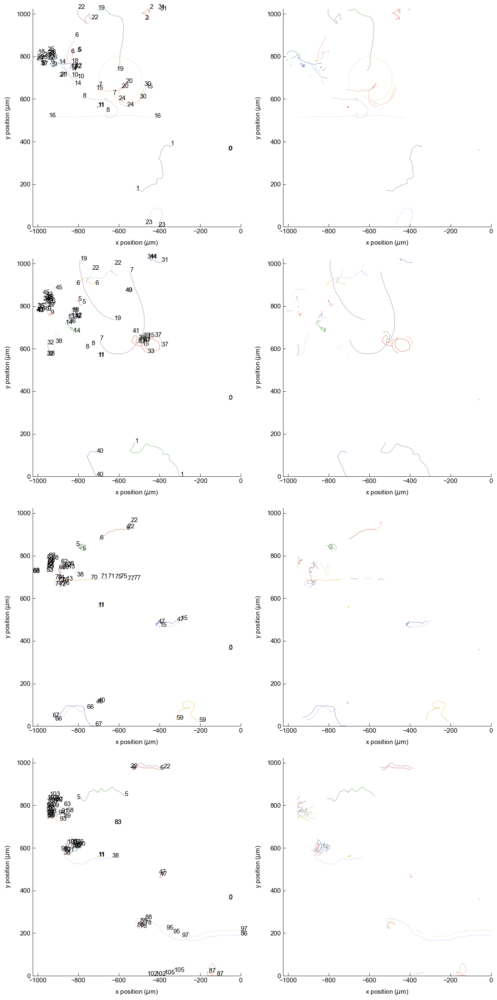

In [96]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 3]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 1, 19, 16, 8, 16, 6, 23, 
# 1 V/cm : 1, 19, 7, 22, 6, 31, 
# 3 V/cm : 67, 59, 6, 
# 5 V/cm :  38, 86, 22, 5, 



(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(4), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(4), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(4), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(4), np.int64(5))


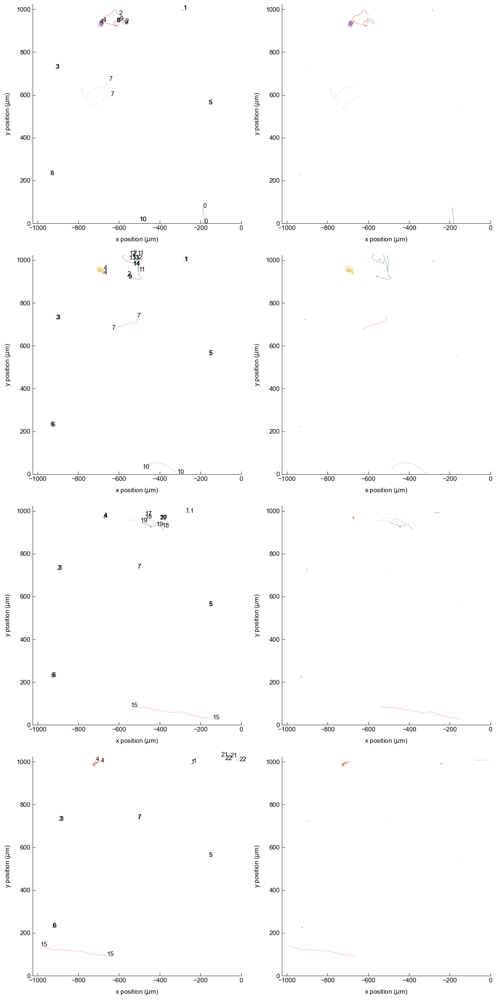

In [97]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 4]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 7, 2
# 1 V/cm : 7, 10, 2, 
# 3 V/cm : 17, 
# 5 V/cm :  


(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(5), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(5), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(5), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(5), np.int64(5))


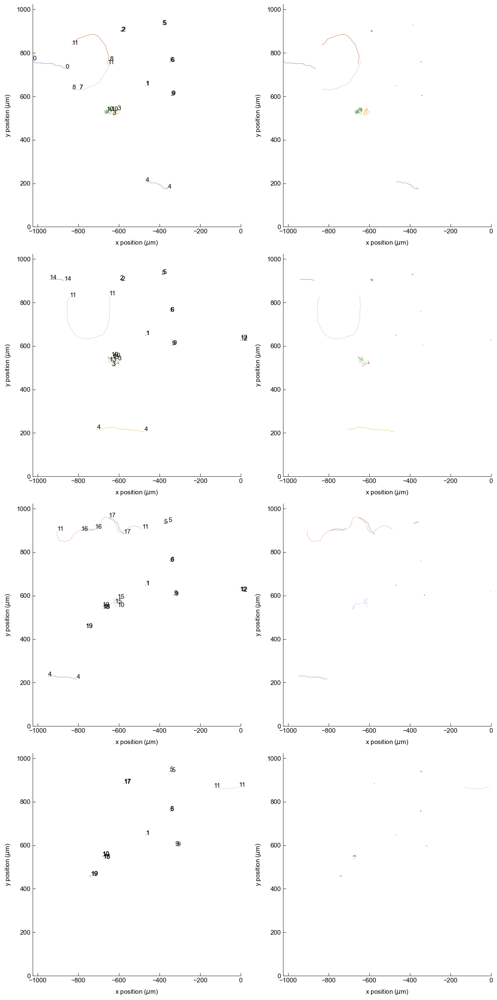

In [101]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 5]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 8, 11
# 1 V/cm : 11
# 3 V/cm : 11
# 5 V/cm :  11


(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(6), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(6), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(6), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(6), np.int64(5))


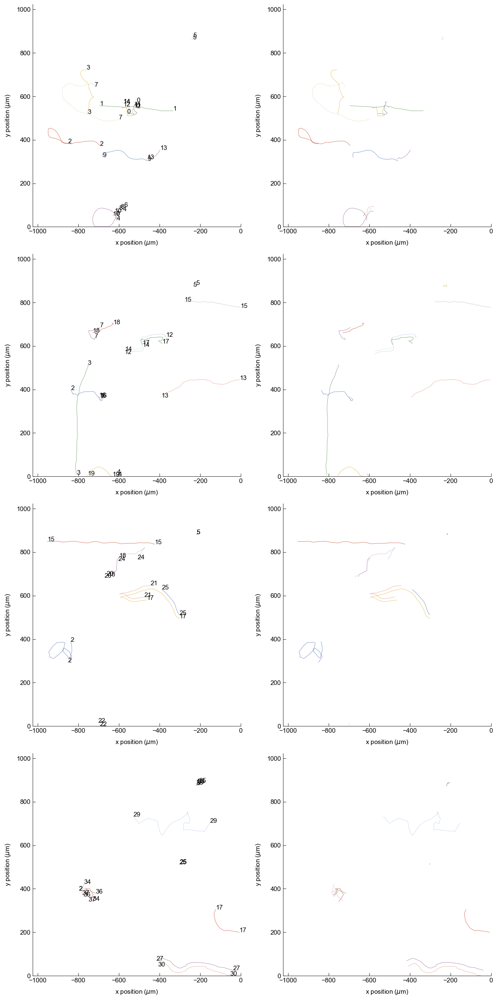

In [102]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 6]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 2, 3, 7, 9, 4
# 1 V/cm : 13, 18, 12, 3, 
# 3 V/cm : 17, 2, 24
# 5 V/cm :  29, 17, 30


(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(7), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(7), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(7), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(7), np.int64(5))


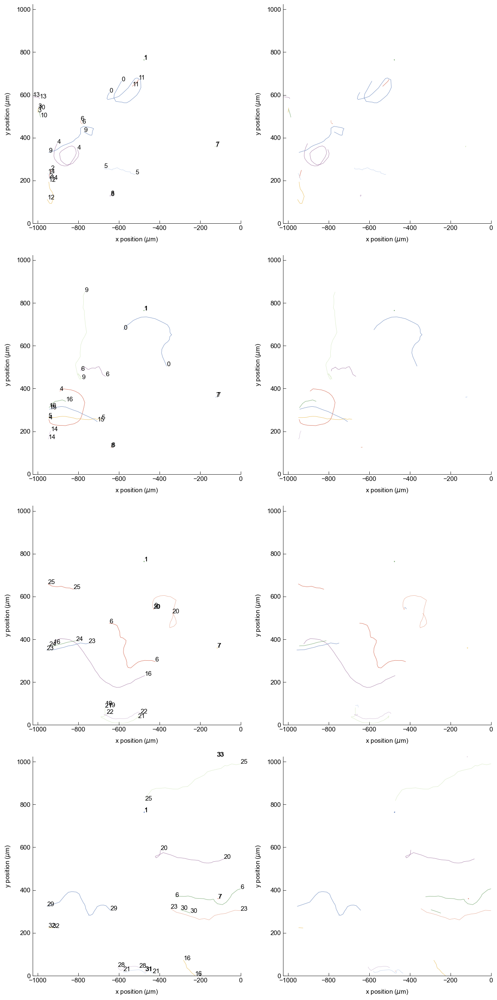

In [106]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 7]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 9, 4, 12, 0
# 1 V/cm : 15, 4, 0, 9, 6, 16 
# 3 V/cm : 23, 16, 25, 20, 6, 21
# 5 V/cm :  23, 6, 20, 29, 25, 21, 16



(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(8), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(8), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(8), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(8), np.int64(5))


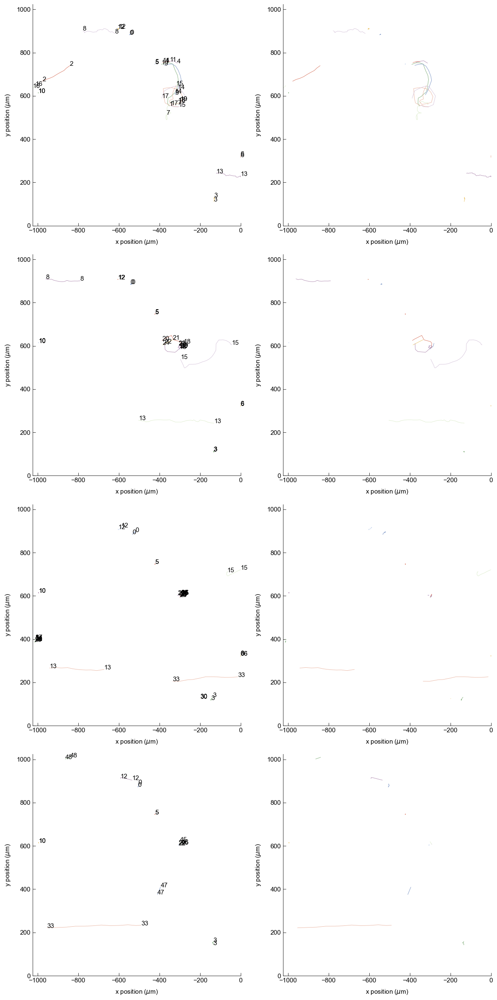

In [107]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 8]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 2, 1, 15
# 1 V/cm : 15, 
# 3 V/cm : 15, 
# 5 V/cm :  


(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(9), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(9), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(9), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(9), np.int64(5))


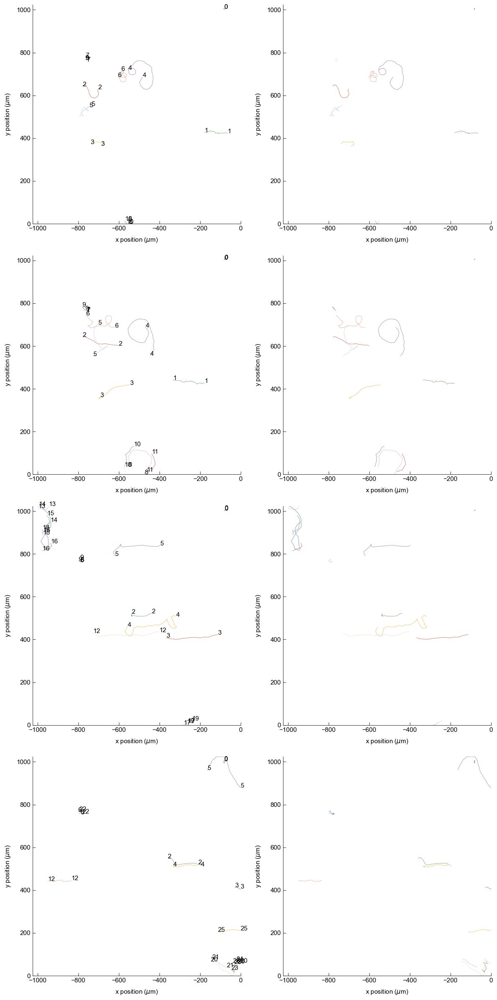

In [10]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 9]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 4, 2, 6, 5, 3, 
# 1 V/cm :  3, 2, 4, 6, 8
# 3 V/cm : 3, 4, 2, 5, 14
# 5 V/cm :  2, 20, 5, 3, 


(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(10), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(10), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(10), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(10), np.int64(5))


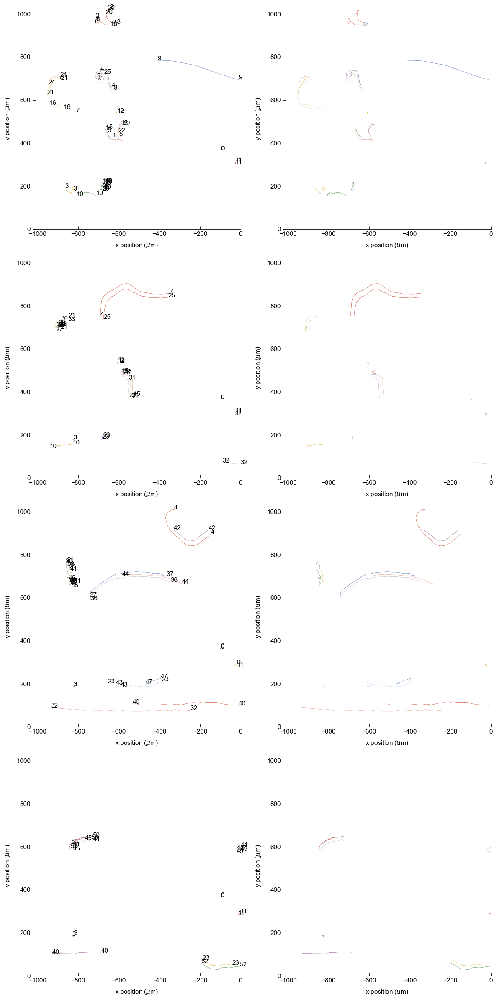

In [14]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 10]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 45:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 9, 7, 8, 2, 
# 1 V/cm :  21, 25, 15, 
# 3 V/cm : 36, 4, 45, 23
# 5 V/cm :  41, 52, 



## Oslo - zebrafish_slideB (prep 1)

In [15]:
# for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
#     if sg[1] == 'AP':
#         print(sg)

(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(0), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(0), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(0), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(0), np.int64(5))


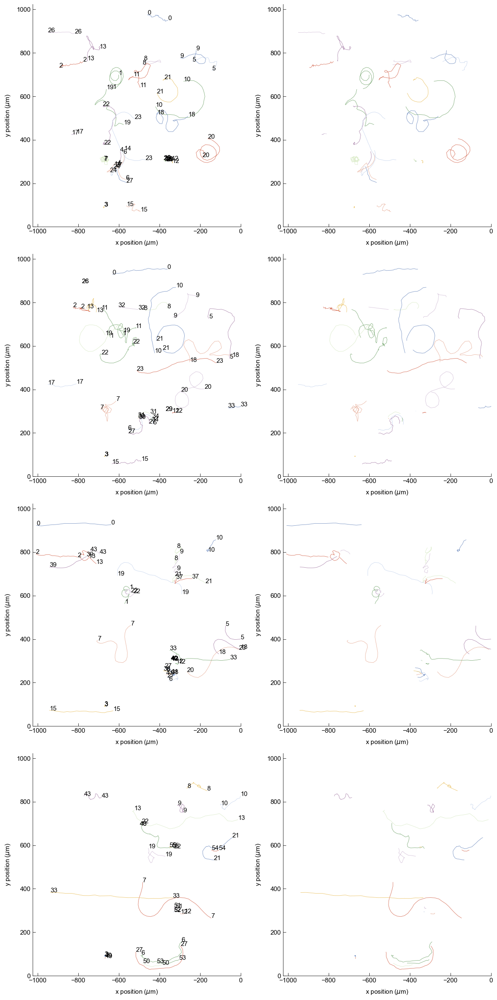

In [17]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 0]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 45:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 13, 8, 9, 5, 11, 1, 21, 10, 18, 22, 23, 20, 6
# 1 V/cm :  13, 19, 23, 21, 10, 9, 5, 18, 7, 27, 11, 20
# 3 V/cm : 39, 13, 7, 20, 18, 6, 19, 8, 9, 10, 37, 1, 22 
# 5 V/cm :  19, 7, 27, 21, 13, 9, 43, 8, 22




(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(1), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(1), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(1), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(1), np.int64(5))


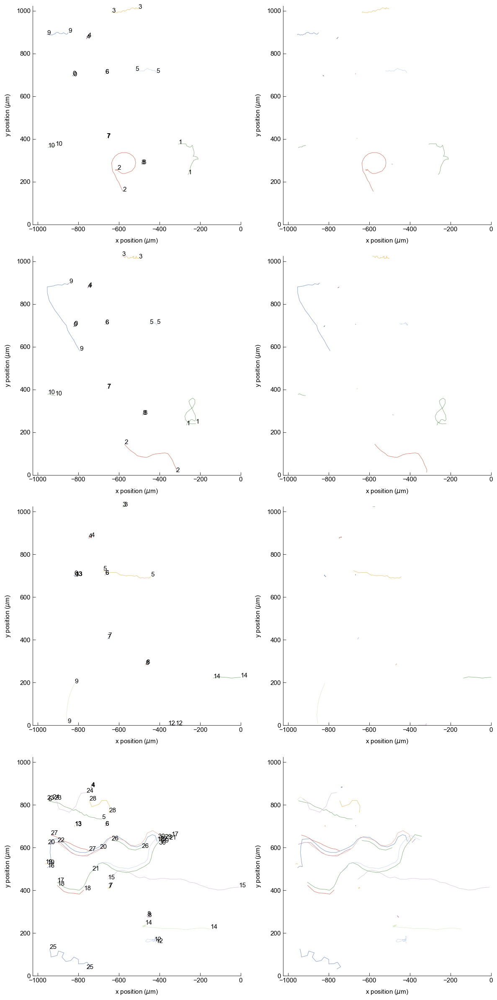

In [18]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 1]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 45:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 2, 1, 
# 1 V/cm : 9, 1, 2   
# 3 V/cm : 9
# 5 V/cm :  12, 25, 15, 17, 16, 24



(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(2), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(2), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(2), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(2), np.int64(5))


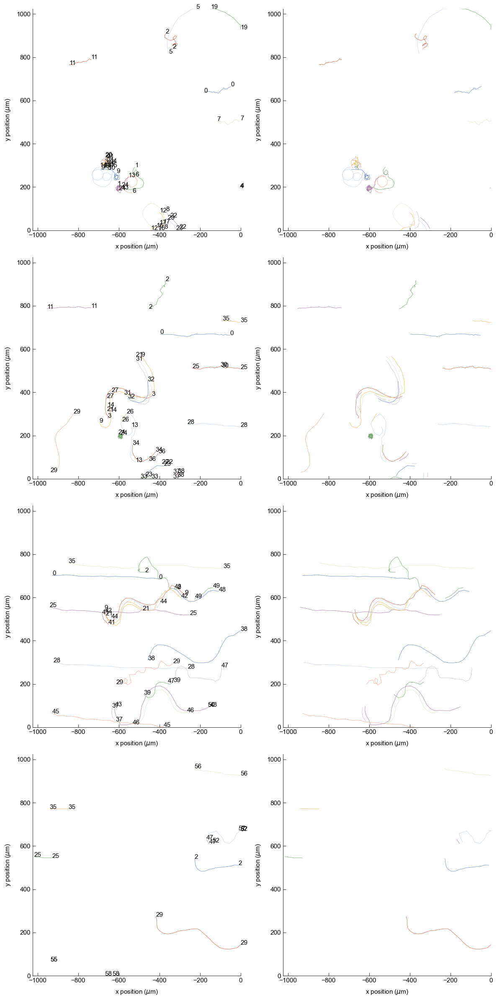

In [20]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 2]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 45:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 5, 19, 2, 9, 6, 12
# 1 V/cm :  29, 9, 23, 13, 2, 
# 3 V/cm : 9, 39, 43, 2, 9, 38
# 5 V/cm :  29, 2, 52



(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(4), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(4), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(4), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(4), np.int64(5))


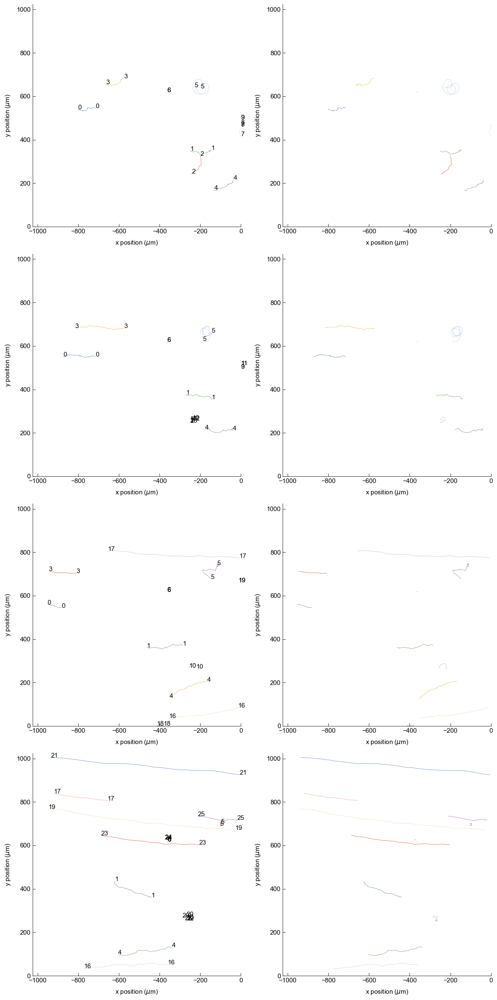

In [22]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 4]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 45:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 2, 
# 1 V/cm : 5, 2
# 3 V/cm : 2
# 5 V/cm :  2



(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(5), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(5), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(5), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(5), np.int64(5))


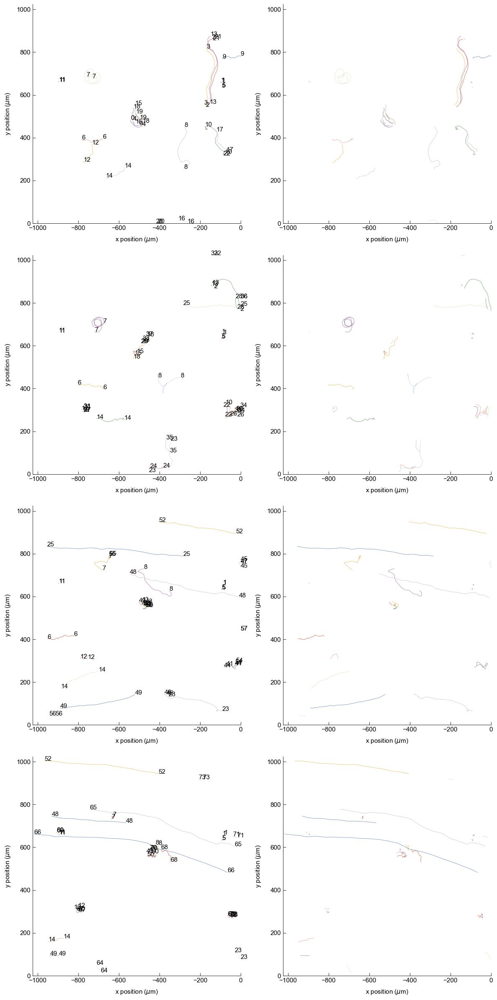

In [25]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 5]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 44:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 13, 7, 12, 8, 10, 15
# 1 V/cm : 7, 23, 8, 18, 10, 12
# 3 V/cm : 7, 8, 48, 12, 23, 44
# 5 V/cm : 12, 50, 68, 23, 



(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(7), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(7), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(7), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(7), np.int64(5))


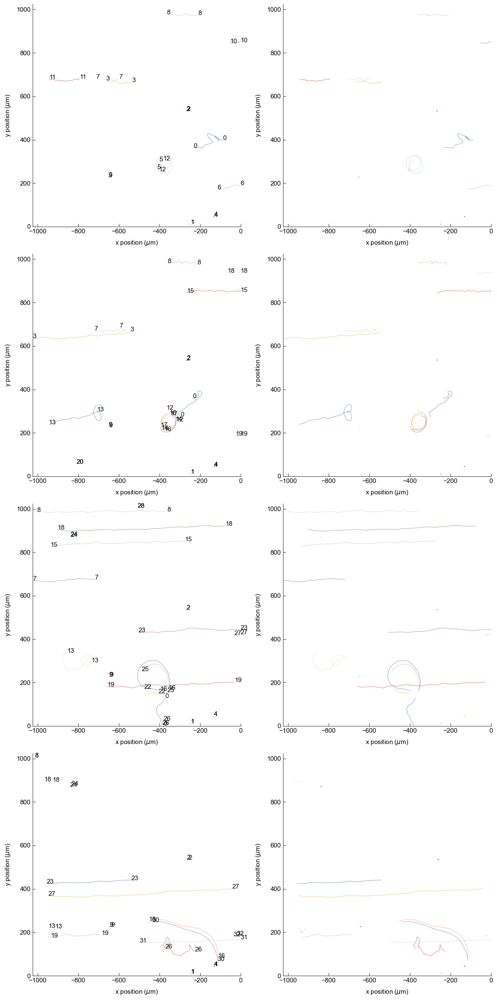

In [28]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 7]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 12, 0, 
# 1 V/cm : 13, 0, 16
# 3 V/cm : 13, 0, 16
# 5 V/cm : 13, 26, 16



(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(8), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(8), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(8), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(8), np.int64(5))


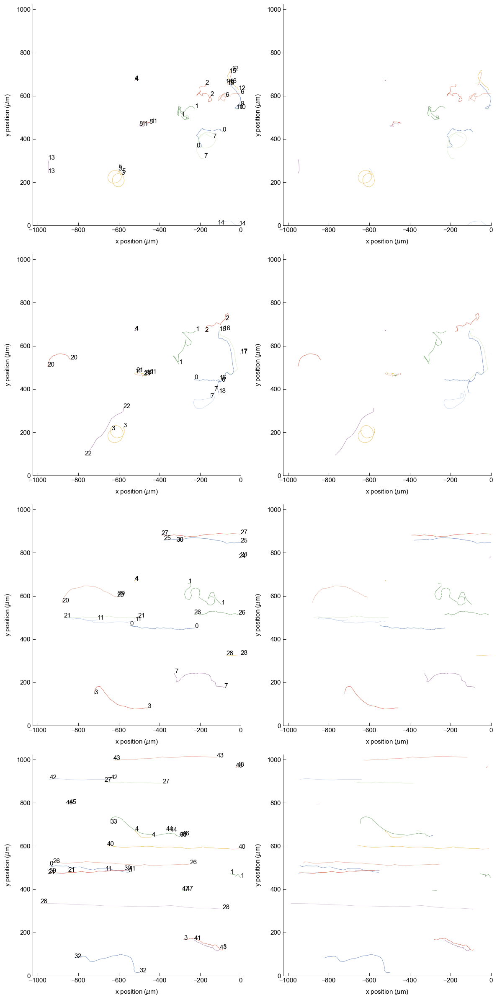

In [29]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 8]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 5, 13, 7, 1, 2, 6, 10
# 1 V/cm : 3, 20, 7, 18, 1, 2
# 3 V/cm : 3, 7, 20, 1
# 5 V/cm :32, 3, 33, 




(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(9), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(9), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(9), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(9), np.int64(5))


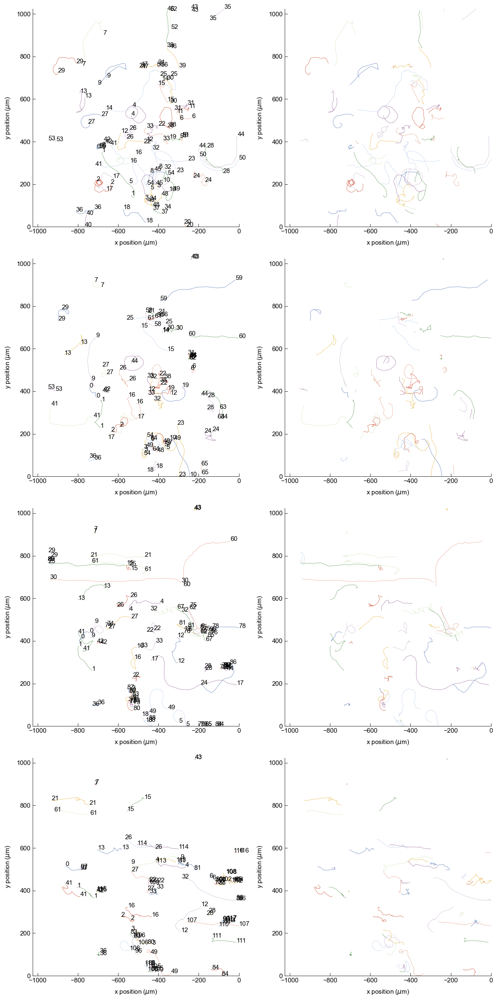

In [30]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 9]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 29, 7, 1, 27, 13, 9, 4, 16, 16, 46, 18, 2, 17, 44, 28, 38, 33, 10, 3, 23 
# 1 V/cm : 41, 29, 13, 9, 15, 30, 16, 30, 4, 27, 44, 28, 23, 10, 3, 18, 2, 1, 32, 19, 24, 26, 54, 49,     
# 3 V/cm : 59, 29, 41, 1, 0, 9, 12, 18, 19, 26, 4, 32, 27, 22, 33, 17, 81, 16, 80, 83, 5, 49
# 5 V/cm : 0, 1, 41, 4, 106, 26, 114, 9, 27, 33, 12, 110, 99, 26, 13, 22, 49, 96, 6, 102



(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(10), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(10), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(10), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(10), np.int64(5))


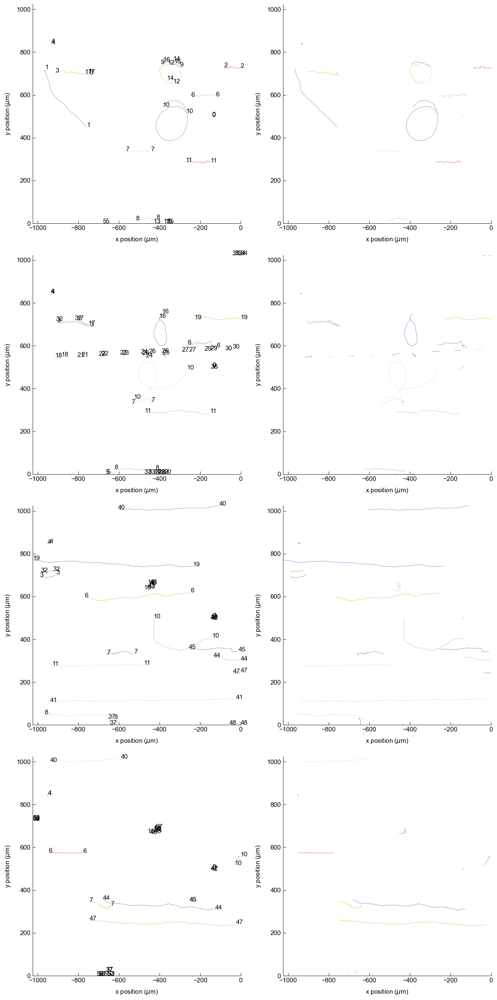

In [31]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 10]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 1, 10, 12
# 1 V/cm : 16, 10    
# 3 V/cm : 16, 10
# 5 V/cm : 16, 10



(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(11), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(11), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(11), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(11), np.int64(5))


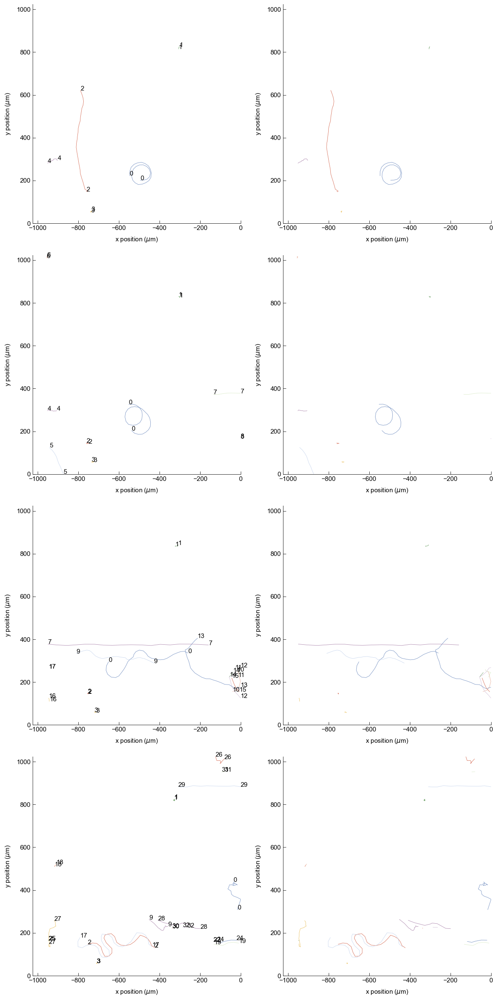

In [32]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 11]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 2, 0
# 1 V/cm : 0
# 3 V/cm : 9, 0, 13, 
# 5 V/cm : 27, 17, 9



(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(12), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(12), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(12), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(12), np.int64(5))


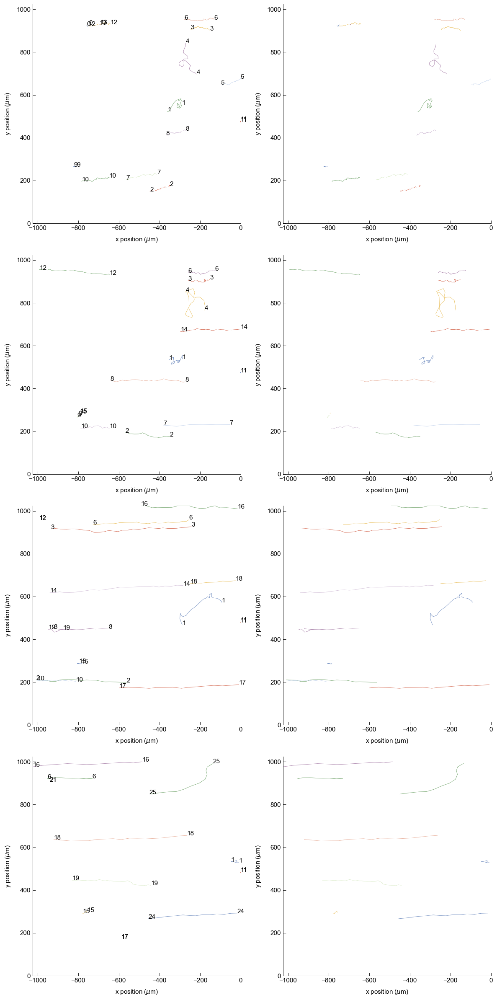

In [33]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 12]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 1, 4
# 1 V/cm : 1, 4
# 3 V/cm :  1
# 5 V/cm : 



## Rio - Zebrafish group B, prep 2

(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(0), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(0), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(0), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(0), np.int64(5))


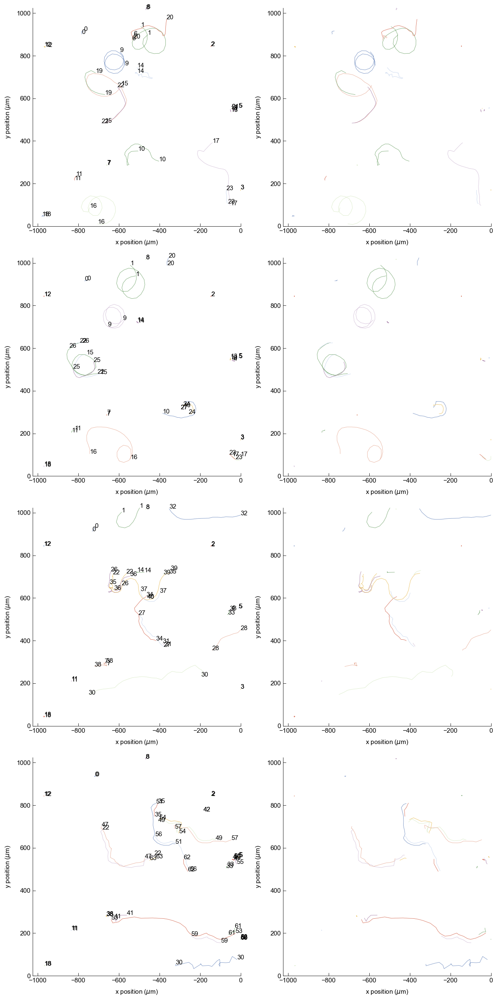

In [10]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 0]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 20, 1, 9, 15, 16, 17, 10, 14
# 1 V/cm : 1, 9, 22, 10, 16, 
# 3 V/cm : 30, 35, 22, 1, 32
# 5 V/cm : 53, 22, 57, 51, 30




(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(1), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(1), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(1), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(1), np.int64(5))


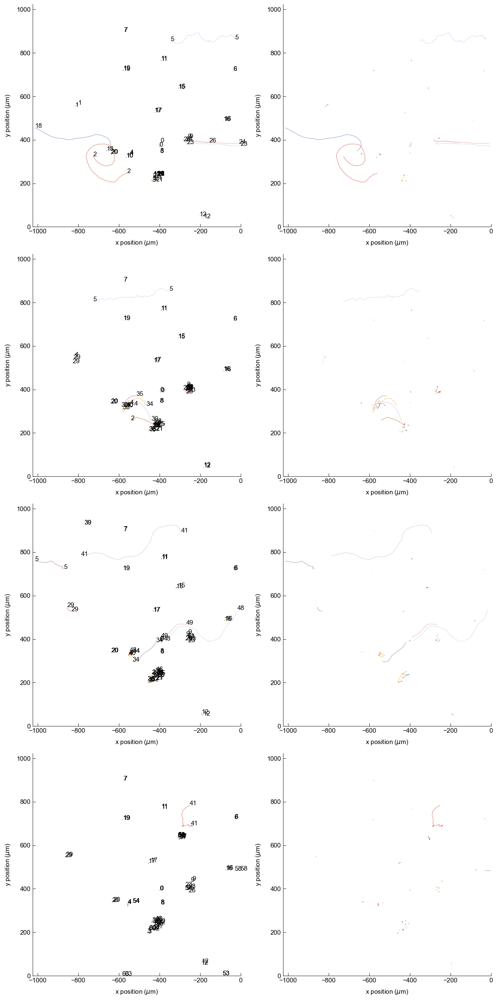

In [11]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 1]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 2, 18
# 1 V/cm : 2, 30, 34, 35
# 3 V/cm : 48, 41
# 5 V/cm : 41




(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(2), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(2), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(2), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(2), np.int64(5))


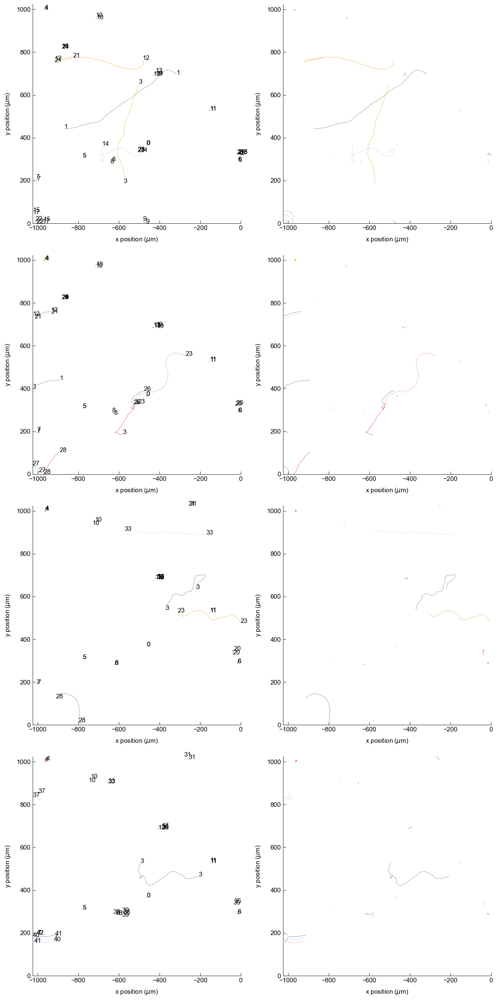

In [24]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 2]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 12, 1, 3, 14
# 1 V/cm : 1, 21, 3, 23
# 3 V/cm : 3, 23, 28
# 5 V/cm : 3, 40, 37



(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(3), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(3), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(3), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(3), np.int64(5))


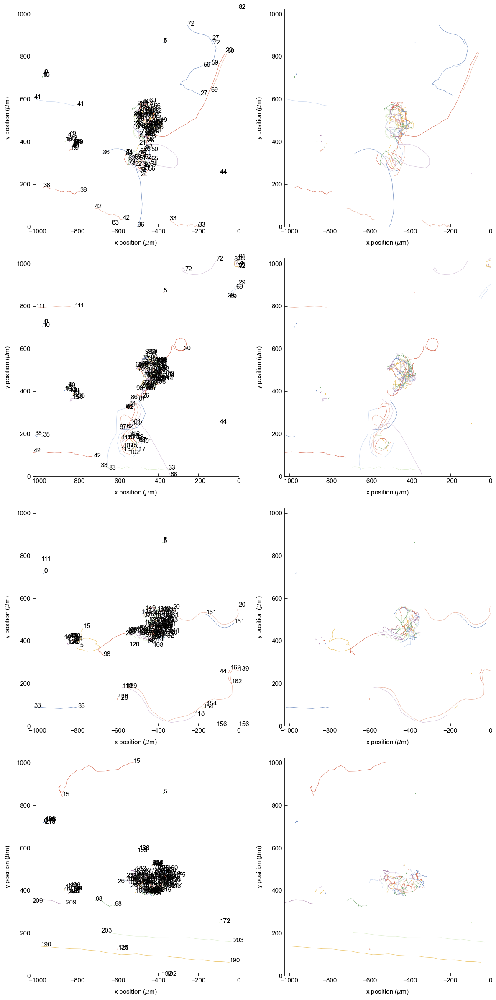

In [29]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 3]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i >= 30:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 41, 27, 36, 29, 26, 24
# 1 V/cm : 20, 72, 33, 117, 82
# 3 V/cm : 98, 15, 118, 20,
# 5 V/cm : 98, 15





(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(4), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(4), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(4), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(4), np.int64(5))


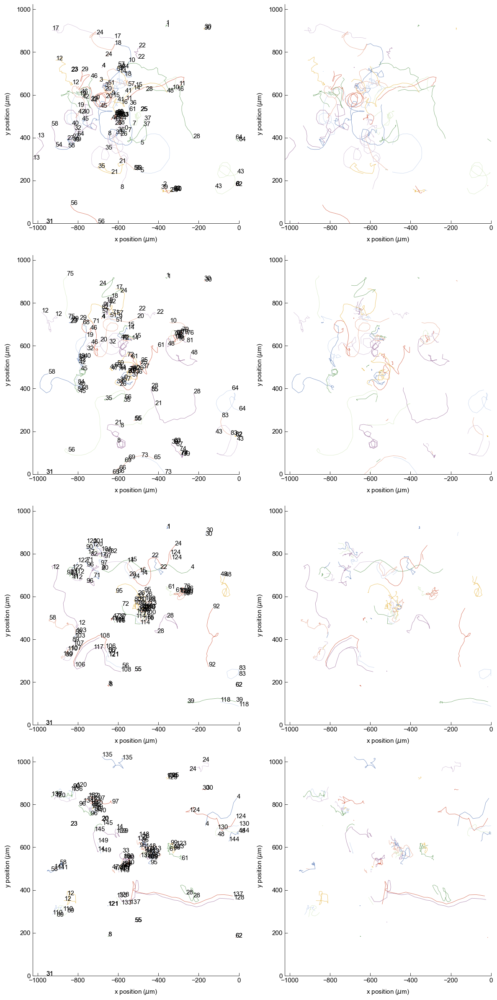

In [26]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 4]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 17, 24, 12, 58, 13, 20, 19, 57, 28, 48, 11, 21, 35, 8, 5, 37, 54, 42, 40, 46, 29, 18,   
# 1 V/cm : 75, 12, 58, 24, 17, 58, 56, 22, 61, 32, 20, 46, 17, 18, 48, 10, 45, 28, 32, 14, 15, 64, 43, 83, 65, 8, 26
# 3 V/cm : 12, 92, 48, 22, 24, 96, 71, 97, 28, 72, 95, 108, 58, 4, 61, 76, 20, 120, 122, 114
# 5 V/cm : 149, 128, 12, 110, 58, 28, 4, 124, 61, 123, 97, 135, 24, 145, 123




(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(5), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(5), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(5), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(5), np.int64(5))


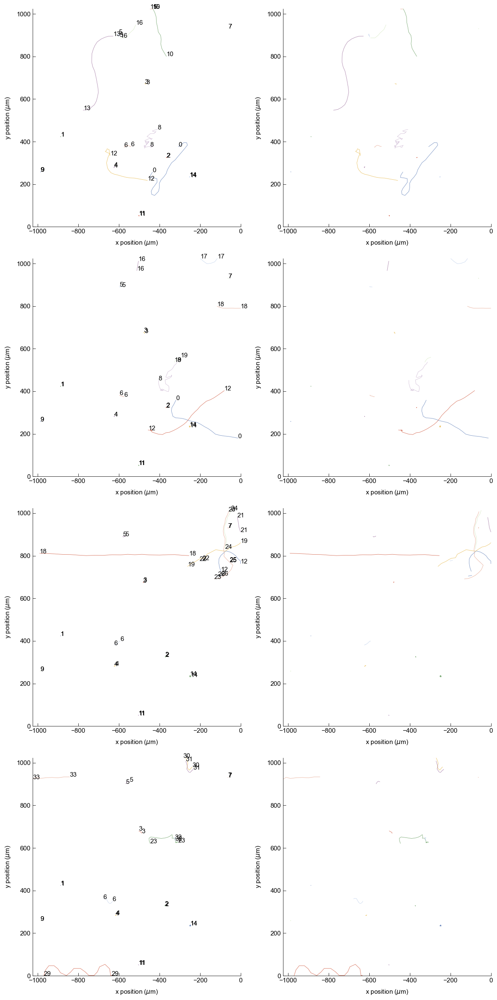

In [15]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 5]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 0, 12, 8, 13, 10
# 1 V/cm : 8, 0, 12
# 3 V/cm : 19, 12, 23
# 5 V/cm : 29, 30, 23




(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(6), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(6), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(6), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(6), np.int64(5))


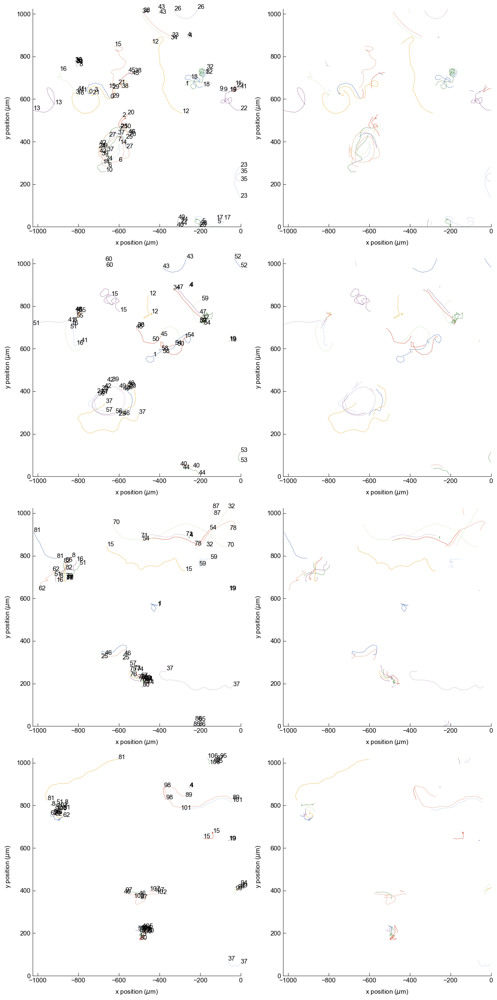

In [16]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 6]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 13, 16, 3, 21, 15, 12, 34, 18, 32, 22, 23, 
# 1 V/cm : 37, 1, 12, 15, 45, 56, 46, 50, 54, 50, 43, 34, 59, 16, 51
# 3 V/cm : 15, 70, 54, 37, 46, 81, 78
# 5 V/cm : 89, 81, 102




(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(7), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(7), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(7), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(7), np.int64(5))


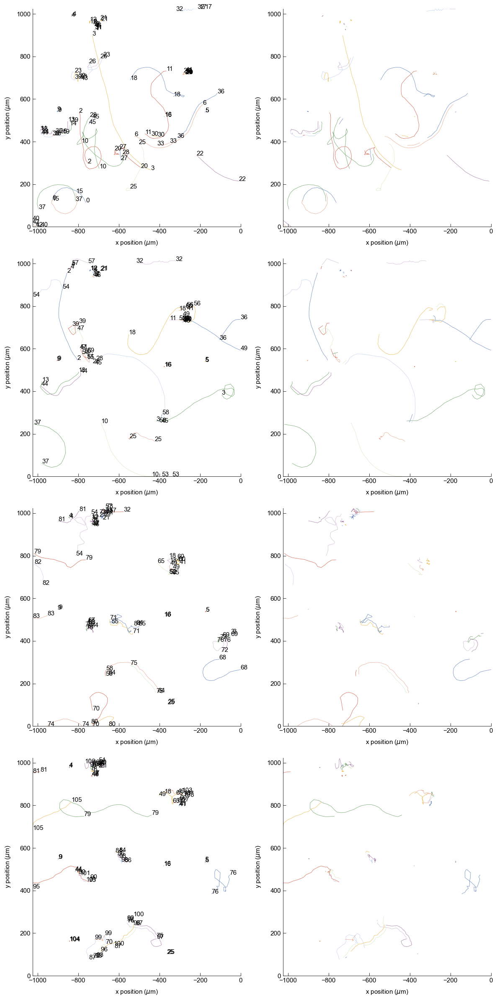

In [33]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 7]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 45:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   
            
    plt.tight_layout()


# 0 V/cm : 37, 10, 2, 13, 3, 25, 36, 11, 18, 22, 23
# 1 V/cm : 37, 2, 45, 49, 36, 18, 25, 10, 44, 47, 41
# 3 V/cm : 71, 68, 70, 79, 81, 54, 82, 
# 5 V/cm : 105, 79, 76, 87, 96, 97, 


(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(8), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(8), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(8), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(8), np.int64(5))


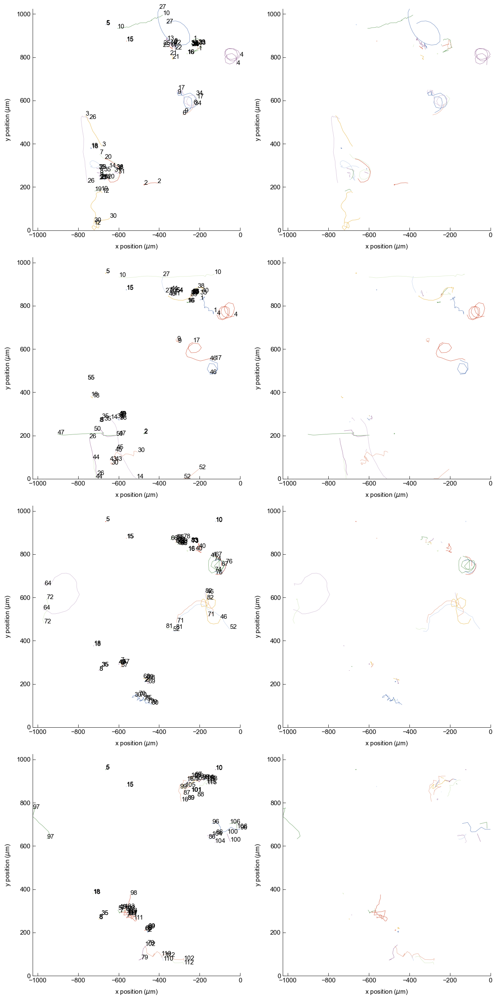

In [18]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 8]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 26, 27, 3, 12, 9, 4, 
# 1 V/cm : 26, 14, 4, 17, 1, 27, 17, 46, 30, 
# 3 V/cm : 52, 74, 64, 46, 40, 30
# 5 V/cm : 97, 102, 96




(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(9), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(9), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(9), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(9), np.int64(5))


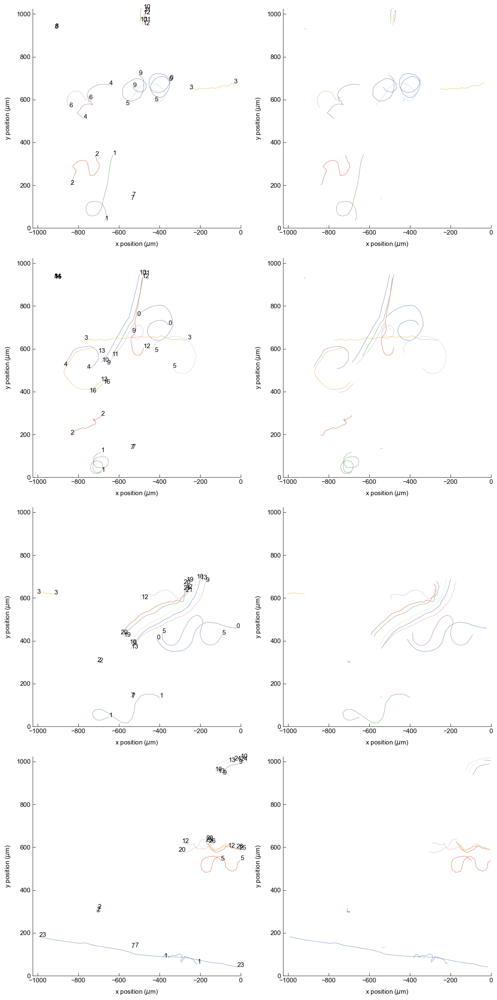

In [19]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 9]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()

# 0 V/cm : 1, 2, 4, 6, 9, 5, 
# 1 V/cm : 4, 2, 1, 10, 0, 5, 13
# 3 V/cm : 1, 0, 5, 10, 20
# 5 V/cm : 1, 5, 12, 10






(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(10), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(10), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(10), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(10), np.int64(5))


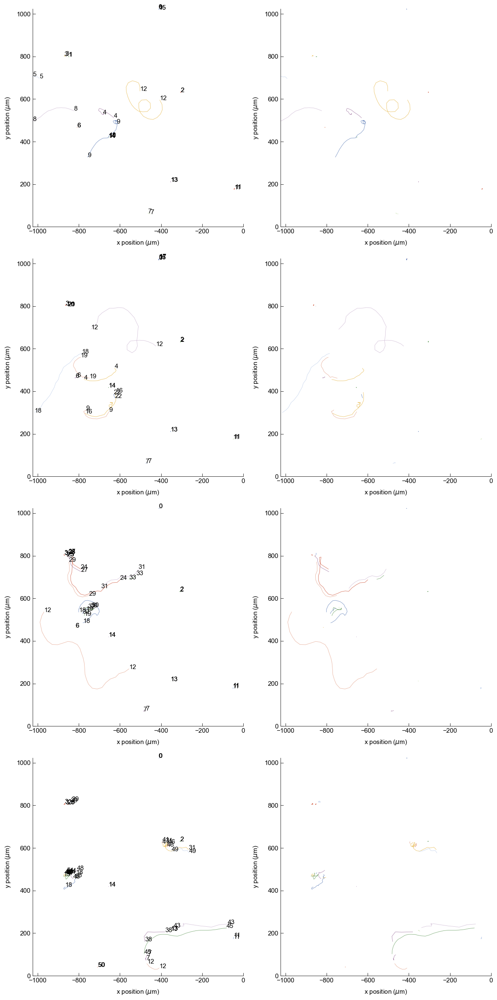

In [20]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 10]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 8, 4, 9, 12
# 1 V/cm : 18, 4, 12, 16
# 3 V/cm : 12, 24, 18
# 5 V/cm : 45, 31, 18





(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(11), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(11), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(11), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(11), np.int64(5))


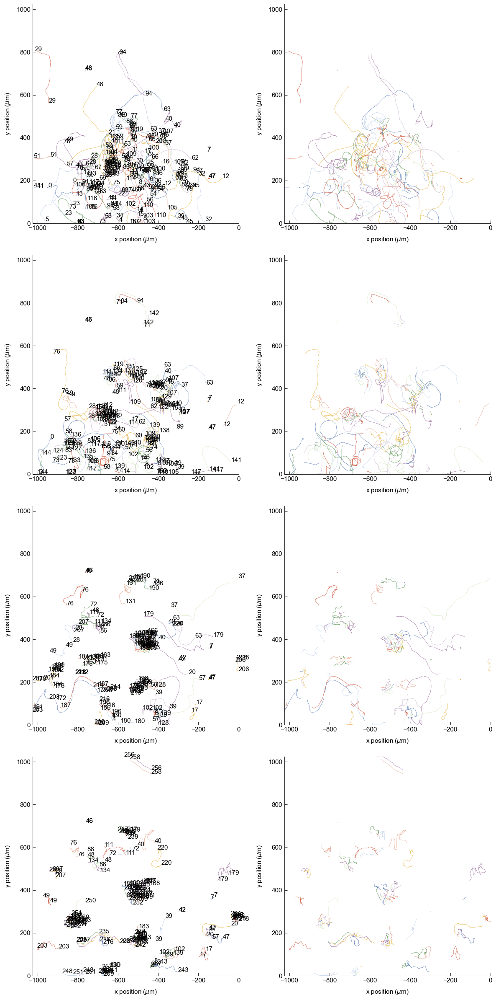

In [21]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 11]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 29, 71, 48, 40, 57, 49, 76, 77, 59, 86, 19, 63, 37, 100, 32, 21, 28, 67, 0, 73, 5, 102, 105, 43, 56, 109, 4, 12
# 1 V/cm : 76, 71, 49, 0, 12, 141, 63, 99, 109, 48, 111, 114, 62, 17, 75, 57, 123, 124, 14
# 3 V/cm : 76, 37, 131, 190, 20, 179, 63, 40, 20, 39, 49, 28, 207, 72, 187, 203, 17, 128, 56
# 5 V/cm : 243, 17, 203, 47, 20, 39, 216, 235, 102, 179, 220, 49, 207, 76, 134, 86, 111, 72, 40, 220, 258




(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(12), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(12), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(12), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(12), np.int64(5))


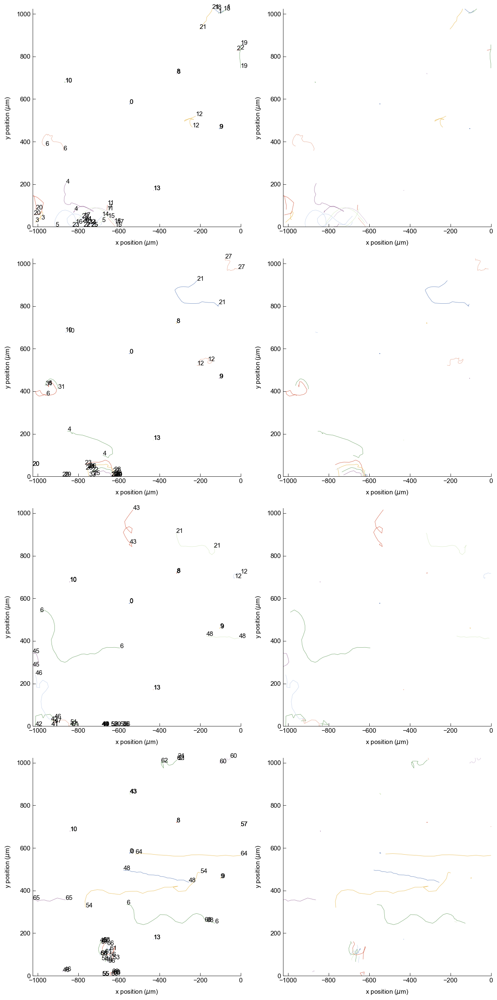

In [22]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 12]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 6, 4, 12, 20
# 1 V/cm : 6, 4, 21, 12, 27, 23
# 3 V/cm : 6, 43, 21, 46
# 5 V/cm : 62, 5, 54, 60, 53



(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(13), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(13), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(13), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(13), np.int64(5))


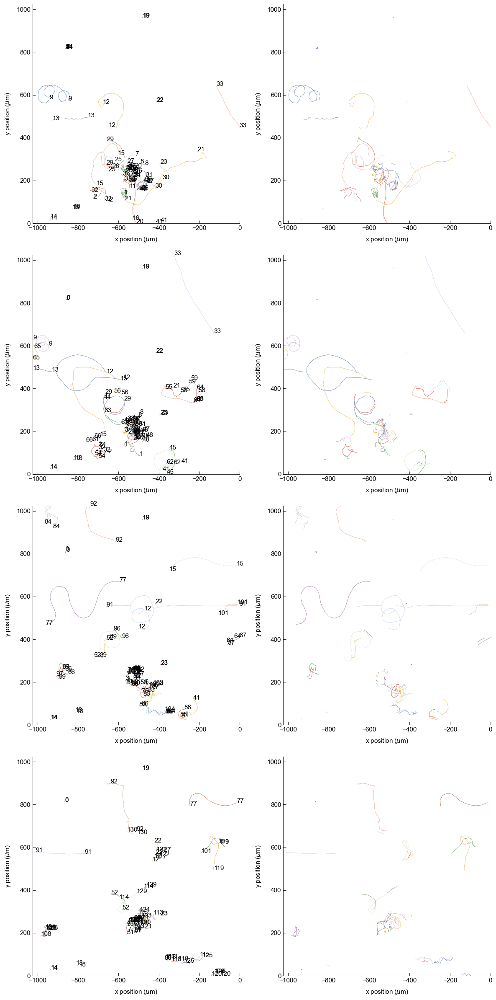

In [23]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 13]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
             
    plt.tight_layout()


# 0 V/cm : 9, 12, 23, 21, 29, 15, 2, 21, 20, 
# 1 V/cm : 33, 12, 9, 15, 29, 63, 21, 61, 41
# 3 V/cm : 84, 92, 77, 12, 66, 41, 86, 89, 
# 5 V/cm : 92, 77, 52, 119, 101, 12, 114






In [23]:



###############################
# Plotting stuff
###############################

def legend_without_duplicate_labels(ax):
    handles, labels = ax.get_legend_handles_labels()
    unique = [(h, l) for i, (h, l) in enumerate(zip(handles, labels)) if l not in labels[:i]]
    ax.legend(*zip(*unique), bbox_to_anchor=(1.05, 1.0), loc='upper left')

###############################
# directionality calculation
# https://stackoverflow.com/questions/2827393/angles-between-two-n-dimensional-vectors-in-python
###############################
def unit_vector(vector):
    """ Returns the unit vector of the vector.  """
    return vector / np.linalg.norm(vector)

def angle_between(v1, v2):
    """ Returns the angle in radians between vectors 'v1' and 'v2'::

            >>> angle_between((1, 0, 0), (0, 1, 0))
            1.5707963267948966
            >>> angle_between((1, 0, 0), (1, 0, 0))
            0.0
            >>> angle_between((1, 0, 0), (-1, 0, 0))
            3.141592653589793
    """
    v1_u = unit_vector(v1)
    v2_u = unit_vector(v2)
    return np.arccos(np.clip(np.dot(v1_u, v2_u), -1.0, 1.0)) 

###############################
# for bootstrap analysis
###############################
# Number of replicatess
n_reps = 2000
rg = np.random.default_rng(3252)

def draw_bs_rep(data, func, rg):
    """Compute a bootstrap replicate from data."""
    bs_sample = rg.choice(data, size=len(data))
    return func(bs_sample)



In [24]:


dict_test = {(0, 'AP', 'zebrafish_slideA', 0) : [[1],
                                    [1],
                                    [9],
                                     []],
(0, 'AP', 'zebrafish_slideA', 1) : [[],
                                    [],
                                    [],
                                     []],
(0, 'AP', 'zebrafish_slideA', 2) : [[0, 1, 2],
                                    [9, 10],
                                    [],
                                     []],
(0, 'AP', 'zebrafish_slideA', 3) : [[0],
                                    [],
                                    [],
                                     []],
(0, 'AP', 'zebrafish_slideA', 4) : [[4],
                                    [],
                                    [],
                                     [7, 3]],
(0, 'AP', 'zebrafish_slideA', 5) : [[4, 5, 1],
                                    [11, 12],
                                    [12],
                                     []],
(0, 'AP', 'zebrafish_slideA', 6) : [[2, 3],
                                    [2],
                                    [7],
                                     []],
(0, 'AP', 'zebrafish_slideA', 7) : [[8],
                                    [],
                                    [],
                                     []],
(0, 'AP', 'zebrafish_slideA', 8) : [[5],
                                    [],
                                    [],
                                     []],
(0, 'AP', 'zebrafish_slideA', 9) : [[],
                                    [],
                                    [],
                                     []],
(0, 'AP', 'zebrafish_slideA', 10) : [[],
                                    [],
                                    [],
                                     []],
(0, 'AP', 'zebrafish_slideA', 11) : [[1],
                                    [1],
                                    [1],
                                     [1]],
(1, 'NB', 'zebrafish_slideA', 0) : [[10, 5, 8, 3, 12, 3],
                                    [8, 12, 10, 3, 16],
                                    [40, 3, 19, 33],
                                     [3, 40, 27]],
(1, 'NB', 'zebrafish_slideA', 1) : [[13, 35, 22, 0, 32, 13, 10, 23, 19],
                                    [19, 9, 10, 42],
                                    [90, 13, 64, 10],
                                     [9, 111]],
(1, 'NB', 'zebrafish_slideA', 2) : [[14, 19, 2, 6, 10, 1, 17],
                                    [2, 19, 14, 39, 6, 1, 10],
                                    [19, 52, 53, 2, 18],
                                     [75, 2, 19, 20]],
(1, 'NB', 'zebrafish_slideA', 3) : [[1, 19, 16, 8, 16, 6, 23],
                                    [1, 19, 7, 22, 6, 31],
                                    [67, 59, 6],
                                     [38, 86, 22, 5]],
(1, 'NB', 'zebrafish_slideA', 4) : [[7, 2],
                                    [7, 10, 2],
                                    [17],
                                     []],
(1, 'NB', 'zebrafish_slideA', 5) : [[8, 11],
                                    [11],
                                    [11],
                                     [11]],
(1, 'NB', 'zebrafish_slideA', 6) : [[2, 3, 7, 9, 4],
                                    [13, 18, 12, 3],
                                    [17, 2, 24],
                                     [29, 17, 30]],
(1, 'NB', 'zebrafish_slideA', 7) : [[9, 4, 12, 0],
                                    [15, 4, 0, 9, 6, 16],
                                    [23, 16, 25, 20, 6, 21],
                                     [23, 6, 20, 29, 25, 21, 16]],
(1, 'NB', 'zebrafish_slideA', 8) : [[2, 1, 15],
                                    [15],
                                    [15],
                                     []],
(1, 'NB', 'zebrafish_slideA', 9) : [[4, 2, 6, 5, 3],
                                    [3, 2, 4, 6, 8],
                                    [3, 4, 2, 5, 14],
                                     [2, 20, 5, 3]],
(1, 'NB', 'zebrafish_slideA', 10) : [[9, 7, 8, 2],
                                    [21, 25, 15],
                                    [36, 4, 45, 23],
                                     [41, 52]],
(0, 'NB', 'zebrafish_slideB', 0) : [[13, 8, 9, 5, 11, 1, 21, 10, 18, 22, 23, 20, 6],
                                    [13, 19, 23, 21, 10, 9, 5, 18, 7, 27, 11, 20],
                                    [39, 13, 7, 20, 18, 6, 19, 8, 9, 10, 37, 1, 22 ],
                                     [19, 7, 27, 21, 13, 9, 43, 8, 22]],
(0, 'NB', 'zebrafish_slideB', 1) : [[2, 1],
                                    [9, 1, 2],
                                    [9],
                                     [12, 25, 15, 17, 16, 24]],
(0, 'NB', 'zebrafish_slideB', 2) : [[10, 9, 12, 17, 8, 14, 4],
                                    [17, 20, 10, 21, 19, 15],
                                    [21, 19, 10],
                                     [25]],
(0, 'NB', 'zebrafish_slideB', 2) : [[5, 19, 2, 9, 6, 12],
                                    [ 29, 9, 23, 13, 2],
                                    [9, 39, 43, 2, 9, 38],
                                     [29, 2, 52]],
(0, 'NB', 'zebrafish_slideB', 4) : [[2],
                                    [5, 2],
                                    [2],
                                     [2]],
(0, 'NB', 'zebrafish_slideB', 5) : [[13, 7, 12, 8, 10, 15],
                                    [7, 23, 8, 18, 10, 12],
                                    [7, 8, 48, 12, 23, 44],
                                     [12, 50, 68, 23]],
(0, 'NB', 'zebrafish_slideB', 7) : [[12, 0,],
                                    [13, 0, 16],
                                    [13, 0, 16],
                                     [12, 26, 16]],
(0, 'NB', 'zebrafish_slideB', 8) : [[5, 13, 7, 1, 2, 6, 10],
                                    [3, 20, 7, 18, 1, 2],
                                    [3, 7, 20, 1],
                                     [32, 3, 33]],
(0, 'NB', 'zebrafish_slideB', 9) : [[29, 7, 1, 27, 13, 9, 4, 16, 16, 46, 18, 2, 17, 44, 28, 38, 33, 10, 3, 23 ],
                                    [41, 29, 13, 9, 15, 30, 16, 30, 4, 27, 44, 28, 23, 10, 3, 18, 2, 1, 32, 19, 24, 26, 54, 49],
                                    [59, 29, 41, 1, 0, 9, 12, 18, 19, 26, 4, 32, 27, 22, 33, 17, 81, 16, 80, 83, 5, 49],
                                     [0, 1, 41, 4, 106, 26, 114, 9, 27, 33, 12, 110, 99, 26, 13, 22, 49, 96, 6, 102]],
(0, 'NB', 'zebrafish_slideB', 10) : [[1, 10, 12],
                                    [16, 10],
                                    [16, 10],
                                     [16, 10]],
(0, 'NB', 'zebrafish_slideB', 11) : [[2, 0],
                                    [0],
                                    [ 9, 0, 13],
                                     [27, 17, 9]],
(0, 'NB', 'zebrafish_slideB', 12) : [[1, 4],
                                    [1, 4],
                                    [1],
                                     []],
(1, 'AP', 'zebrafish_slideB', 0) : [[0, 1, 9, 15, 16, 17, 10, 14],
                                    [1, 9, 22, 10, 16],
                                    [30, 35, 22, 1, 32],
                                     [53, 22, 57, 51, 30]],
(1, 'AP', 'zebrafish_slideB', 1) : [[2, 18],
                                    [2, 30, 34, 35],
                                    [48, 41],
                                     [41]],
(1, 'AP', 'zebrafish_slideB', 2) : [[12, 1, 3, 14],
                                    [1, 21, 3, 23],
                                    [3, 23, 28],
                                     [3, 40, 37]],
(1, 'AP', 'zebrafish_slideB', 3) : [[41, 27, 36, 29, 26, 24],
                                    [20, 72, 33, 117, 82],
                                    [98, 15, 118, 20],
                                     [98, 15]],
(1, 'AP', 'zebrafish_slideB', 4) : [[17, 24, 12, 58, 13, 20, 19, 57, 28, 48, 11, 21, 35, 8, 5, 37, 54, 42, 40, 46, 29, 18],
                                    [75, 12, 58, 24, 17, 58, 56, 22, 61, 32, 20, 46, 17, 18, 48, 10, 45, 28, 32, 14, 15, 64, 43, 83, 65, 8, 26],
                                    [12, 92, 48, 22, 24, 96, 71, 97, 28, 72, 95, 108, 58, 4, 61, 76, 20, 120, 122, 114],
                                     [149, 128, 12, 110, 58, 28, 4, 124, 61, 123, 97, 135, 24, 145, 123]],
(1, 'AP', 'zebrafish_slideB', 5) : [[0, 12, 8, 13, 10],
                                    [8, 0, 12],
                                    [19, 12, 23],
                                     [ 29, 30, 23]],
(1, 'AP', 'zebrafish_slideB', 6) : [[13, 16, 3, 21, 15, 12, 34, 18, 32, 22, 23],
                                    [37, 1, 12, 15, 45, 56, 46, 50, 54, 50, 43, 34, 59, 16, 51],
                                    [15, 70, 54, 37, 46, 81, 78],
                                     [89, 81, 102]],
(1, 'AP', 'zebrafish_slideB', 7) : [[37, 10, 2, 13, 3, 25, 36, 11, 18, 22, 23],
                                    [37, 2, 45, 49, 36, 18, 25, 10, 44, 47, 41],
                                    [71, 68, 70, 79, 81, 54, 82],
                                     [105, 79, 76, 87, 96, 97]],
(1, 'AP', 'zebrafish_slideB', 8) : [[26, 27, 3, 12, 9, 4],
                                    [26, 14, 4, 17, 1, 27, 17, 46, 30],
                                    [52, 74, 64, 46, 40, 30],
                                     [97, 102, 96]],
(1, 'AP', 'zebrafish_slideB', 9) : [[1, 2, 4, 6, 9, 5],
                                    [4, 2, 1, 10, 0, 5, 13],
                                    [1, 0, 5, 10, 20],
                                     [1, 5, 12, 10]],
(1, 'AP', 'zebrafish_slideB', 10) : [[8, 4, 9, 12],
                                    [18, 4, 12, 16],
                                    [12, 24, 18],
                                     [45, 31, 18]],
(1, 'AP', 'zebrafish_slideB', 11) : [[29, 71, 48, 40, 57, 49, 76, 77, 59, 86, 19, 63, 37, 100, 32, 21, 28, 67, 0, 73, 5, 102, 105, 43, 56, 109, 4, 12],
                                    [76, 71, 49, 0, 12, 141, 63, 99, 109, 48, 111, 114, 62, 17, 75, 57, 123, 124, 14],
                                    [76, 37, 131, 190, 20, 179, 63, 40, 20, 39, 49, 28, 207, 72, 187, 203, 17, 128, 56],
                                     [243, 17, 203, 47, 20, 39, 216, 235, 102, 179, 220, 49, 207, 76, 134, 86, 111, 72, 40, 220, 258]],
(1, 'AP', 'zebrafish_slideB', 12) : [[6, 4, 12, 20],
                                    [6, 4, 21, 12, 27, 23],
                                    [6, 43, 21, 46],
                                     [62, 5, 54, 60, 53]],
(1, 'AP', 'zebrafish_slideB', 13) : [[9, 12, 23, 21, 29, 15, 2, 21, 20],
                                    [33, 12, 9, 15, 29, 63, 21, 61, 41],
                                    [84, 92, 77, 12, 66, 41, 86, 89],
                                     [92, 77, 52, 119, 101, 12, 114]],
            }

color_dict = dict(zip(df.celltype.unique(), 
                     sns.color_palette("Set2", len(df.celltype.unique())).as_hex())) 



(0, 'AP', 'zebrafish_slideA', 0)
(0, 'AP', 'zebrafish_slideA', 1)
(0, 'AP', 'zebrafish_slideA', 2)
(0, 'AP', 'zebrafish_slideA', 3)
(0, 'AP', 'zebrafish_slideA', 4)
(0, 'AP', 'zebrafish_slideA', 5)
(0, 'AP', 'zebrafish_slideA', 6)
(0, 'AP', 'zebrafish_slideA', 7)
(0, 'AP', 'zebrafish_slideA', 8)
(0, 'AP', 'zebrafish_slideA', 9)
(0, 'AP', 'zebrafish_slideA', 10)
(0, 'AP', 'zebrafish_slideA', 11)
(1, 'NB', 'zebrafish_slideA', 0)
(1, 'NB', 'zebrafish_slideA', 1)
(1, 'NB', 'zebrafish_slideA', 2)
(1, 'NB', 'zebrafish_slideA', 3)
(1, 'NB', 'zebrafish_slideA', 4)
(1, 'NB', 'zebrafish_slideA', 5)
(1, 'NB', 'zebrafish_slideA', 6)
(1, 'NB', 'zebrafish_slideA', 7)
(1, 'NB', 'zebrafish_slideA', 8)
(1, 'NB', 'zebrafish_slideA', 9)
(1, 'NB', 'zebrafish_slideA', 10)
(0, 'NB', 'zebrafish_slideB', 0)
(0, 'NB', 'zebrafish_slideB', 1)
(0, 'NB', 'zebrafish_slideB', 2)
(0, 'NB', 'zebrafish_slideB', 4)
(0, 'NB', 'zebrafish_slideB', 5)
(0, 'NB', 'zebrafish_slideB', 7)
(0, 'NB', 'zebrafish_slideB', 8)
(0, 'NB

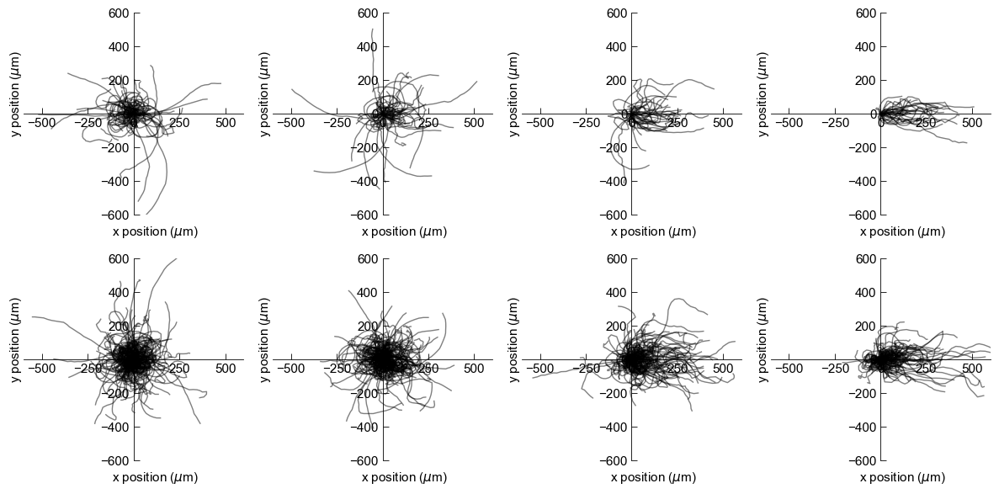

In [27]:
for f in dict_test:
    print(f)

EF_dict = {0 : 0,
           1 : 1, 
           3 : 2, 
           5 : 3}

dict_ax = {'zebrafish_slideA' : 0, 'zebrafish_slideB' : 1}

df_filtered = pd.DataFrame()
    
f, ax = plt.subplots(2, 4, figsize=(12,6))
# ax = ax.ravel()

count = 0
for g, d in df.groupby(['celltype', 'E_V_cm']):
    print(g)
    ###################################################
    ########## figure of relative trajectories ########
    ###################################################
    count_cell = 0
    for i, d_ in d.groupby(['cell',  'trial', 'date', 'user', 'position']):
        #print((i[1],i[3], g[0], i[4]))
        cells_ =dict_test[(i[1],i[3], g[0], i[4])][EF_dict[g[1]]]
        if i[0] not in cells_:
            continue
        
        #if len(d_) <= 5:
        #    continue

        t0_x = d_[d_.frame == d_.frame.min()].x.values
        t0_y = d_[d_.frame == d_.frame.min()].y.values

        if np.shape(t0_x)== (0,):
            continue
        if len(d_.x.values) != len(d_.y.values):
            continue

        ax[dict_ax[g[0]], EF_dict[g[1]]].plot(d_.x - t0_x, 
                       d_.y - t0_y, color = 'k', alpha = 0.5, lw = 1, zorder = 20)
        ax[dict_ax[g[0]], EF_dict[g[1]]].set_xlabel(r'x position ($\mu$m)')
        ax[dict_ax[g[0]], EF_dict[g[1]]].set_ylabel(r'y position ($\mu$m)')

        count_cell += 1
        if d_.celltype.unique() == 'zebrafish_slideB':
            d_['celltype_genotype'] = 'Galvanin_KO'
        elif d_.celltype.unique() == 'zebrafish_slideA':
            d_['celltype_genotype'] = 'Galvanin_WT'
            
        df_filtered = pd.concat([df_filtered, d_], ignore_index = True)
    print(g, count_cell)
        

    #count += 1

        
    for ax_ in ax.ravel():
        ax_.spines['left'].set_position(('data', 0))
        ax_.spines['bottom'].set_position(('data', 0))
        ax_.xaxis.set_label_coords(0.6, -0.05)
        ax_.yaxis.set_label_coords(0.0, 0.6)

        ax_.set_xlim(-600,600)
        ax_.set_ylim(-600,600)
        ax_.set_axisbelow(True)


    plt.tight_layout()
    #plt.savefig('20250315_keratocytes_Last-20min_rel_trajectories.pdf')

    # plt.close()





In [28]:
df_filtered.to_csv('../../data/processed_tracking/20250406_isolated_zebrafish_keratocytes_tracking_filtered.csv')

('zebrafish_slideA',)
[-0.07428941]
[-0.07428941  0.50893559]
[-0.07428941  0.50893559  0.82682071]
[-0.07428941  0.50893559  0.82682071  0.92676369]
[0.0, 1.0, 3.0, 5.0] [-0.07428941  0.50893559  0.82682071  0.92676369]
('zebrafish_slideB',)
[-0.0513123]
[-0.0513123   0.21720662]
[-0.0513123   0.21720662  0.40971096]
[-0.0513123   0.21720662  0.40971096  0.51708909]
[0.0, 1.0, 3.0, 5.0] [-0.0513123   0.21720662  0.40971096  0.51708909]


Text(0.5, 0, 'electric field strength (mV/mm)')

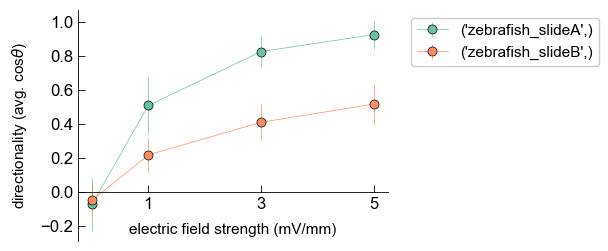

In [26]:
fig, ax = plt.subplots(1,1,figsize = (4,3))

for g, _d in df.groupby(['celltype']):
    print(g)

    E_val = []
    rad_cos_mean = []
    rad_cos_err = []

    for E, d in _d.groupby('E_V_cm'):
        rad = []
        dx = []
        dy = []
        d = d.replace([np.inf, -np.inf], np.nan)
        d = d.dropna()

        for cell, d_ in d.groupby(['cell', 'trial', 'user', 'position', 'date']):
            cells_ = dict_test[(cell[1], cell[2], g[0], cell[3])][EF_dict[E]]
            #if cell[1] == 0:
            #    continue
            if cell[0] not in cells_:
                continue
            #if len(d_.frame.unique())>=10:
            dx2 = d_[d_.frame==d_.frame.max()].x.values[0] - d_[d_.frame==d_.frame.min()].x.values[0]
            dy2 = d_[d_.frame==d_.frame.max()].y.values[0] - d_[d_.frame==d_.frame.min()].y.values[0]

            rad = np.append(rad, angle_between([dx2, dy2], [1, 0]))
        
        
        rad_cos = np.cos(rad)
        rad_cos = rad_cos[~np.isnan(rad_cos)]
        #print(rad_cos)

        # Compute replicates
        bs_reps = np.array(
            [draw_bs_rep(rad_cos, np.mean, rg) for _ in range(n_reps)]
            )

        # Compute the confidence interval
        conf_int = np.percentile(bs_reps, [2.5, 97.5])
        
        E_val = np.append(E_val, E)
        rad_cos_mean = np.append(rad_cos_mean, np.mean(rad_cos))
        rad_cos_err = np.append(rad_cos_err, np.array(np.mean(rad_cos) - conf_int[0], conf_int[1] - np.mean(rad_cos)))
        print(rad_cos_mean)
    gene = g
#     ax.errorbar
    print([float(e) for e in E_val], rad_cos_mean)
    ax.errorbar([float(e) for e in E_val], rad_cos_mean, 
                yerr = rad_cos_err,
               color = color_dict[g[0]], marker ='o', markersize= 6.5, linewidth = 0.5,
                linestyle = '-', label = g, markeredgecolor = 'k',
               markeredgewidth = 0.5)


legend_without_duplicate_labels(ax)
ax.spines['bottom'].set_position(('data', 0))
# ax.set_ylim(-0.1, 1)
# ax.set_yticks([0,0.5,1.0])
# ax.set_xticks([0,1, 2, 3, 4, 5])
ax.set_xticks([0,1, 3, 5])

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
ax.set_ylabel(r'directionality (avg. cos$\theta$)')
ax.set_xlabel('electric field strength (mV/mm)')

# plt.savefig('20250315_keratocytes_Last-20min_directionality_lastVSfirst.pdf')





('zebrafish_slideA',)
[-0.05666842]
[-0.05666842  0.27621836]
[-0.05666842  0.27621836  0.44085354]


/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encountered in divide
  return vector / np.linalg.norm(vector)


[-0.05666842  0.27621836  0.44085354  0.63203307]
[0.0, 1.0, 3.0, 5.0] [-0.05666842  0.27621836  0.44085354  0.63203307]
('zebrafish_slideB',)


/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encountered in divide
  return vector / np.linalg.norm(vector)


[0.08064557]


/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encountered in divide
  return vector / np.linalg.norm(vector)


[0.08064557 0.26608163]


/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encountered in divide
  return vector / np.linalg.norm(vector)


[0.08064557 0.26608163 0.56887433]
[0.08064557 0.26608163 0.56887433 0.74599136]
[0.0, 1.0, 3.0, 5.0] [0.08064557 0.26608163 0.56887433 0.74599136]


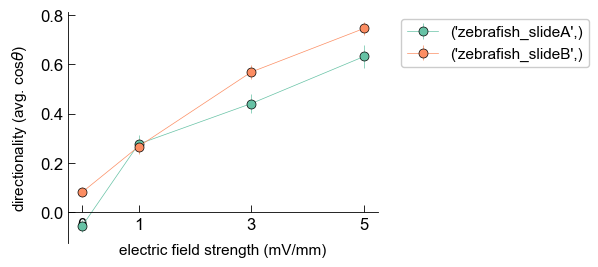

In [219]:
fig, ax = plt.subplots(1,1,figsize = (4,3))

for g, _d in df.groupby(['celltype']):
    print(g)

    E_val = []
    rad_cos_mean = []
    rad_cos_err = []

    for E, d in _d.groupby('E_V_cm'):
        rad = []
        dx = []
        dy = []
        d = d.replace([np.inf, -np.inf], np.nan)
        d = d.dropna()

        for cell, d_ in d.groupby(['cell', 'trial', 'user', 'position', 'date']):
            cells_ = dict_test[(cell[1], cell[2], g[0], cell[3])][EF_dict[E]]
            #if cell[1] == 1:
            #    continue
            if cell[0] not in cells_:
                continue

            
            d_ = d_.replace([np.inf, -np.inf], np.nan)
            d_ = d_.dropna()
            if len(d_.frame.unique()) != len(np.arange(d_.frame.min(), d_.frame.max()+1)):
                continue

            for frame in d_.frame.unique()[:-2]:
                #print(d_[d_.frame==frame + 1].x.values)
                dx2 = d_[d_.frame==frame + 1].x.values[0] - d_[d_.frame==frame].x.values[0]
                dy2 = d_[d_.frame==frame + 1].y.values[0] - d_[d_.frame==frame].y.values[0]
    
                rad = np.append(rad, angle_between([dx2, dy2], [1, 0]))
        
        
        rad_cos = np.cos(rad)
        rad_cos = rad_cos[~np.isnan(rad_cos)]
        #print(rad_cos)

        # Compute replicates
        bs_reps = np.array(
            [draw_bs_rep(rad_cos, np.mean, rg) for _ in range(n_reps)]
            )

        # Compute the confidence interval
        conf_int = np.percentile(bs_reps, [2.5, 97.5])
        
        E_val = np.append(E_val, E)
        rad_cos_mean = np.append(rad_cos_mean, np.mean(rad_cos))
        rad_cos_err = np.append(rad_cos_err, np.array(np.mean(rad_cos) - conf_int[0], conf_int[1] - np.mean(rad_cos)))
        print(rad_cos_mean)
    gene = g
#     ax.errorbar
    print([float(e) for e in E_val], rad_cos_mean)
    ax.errorbar([float(e) for e in E_val], rad_cos_mean, 
                yerr = rad_cos_err,
               color = color_dict[g[0]], marker ='o', markersize= 6.5, linewidth = 0.5,
                linestyle = '-', label = g, markeredgecolor = 'k',
               markeredgewidth = 0.5)


legend_without_duplicate_labels(ax)
ax.spines['bottom'].set_position(('data', 0))
# ax.set_ylim(-0.1, 1)
# ax.set_yticks([0,0.5,1.0])
# ax.set_xticks([0,1, 2, 3, 4, 5])
ax.set_xticks([0,1, 3, 5])

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
ax.set_ylabel(r'directionality (avg. cos$\theta$)')
ax.set_xlabel('electric field strength (mV/mm)')


# plt.savefig('20250315_keratocytes_Last-20min_directionality_allsteps.pdf')


('zebrafish_slideA',)
[-0.09009513]
[-0.09009513  0.28861928]
[-0.09009513  0.28861928  0.44797216]
[-0.09009513  0.28861928  0.44797216  0.65828001]
[0.0, 1.0, 3.0, 5.0] [-0.09009513  0.28861928  0.44797216  0.65828001]
('zebrafish_slideB',)
[0.06990512]
[0.06990512 0.32205709]


/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encountered in divide
  return vector / np.linalg.norm(vector)


[0.06990512 0.32205709 0.5864994 ]
[0.06990512 0.32205709 0.5864994  0.74973964]
[0.0, 1.0, 3.0, 5.0] [0.06990512 0.32205709 0.5864994  0.74973964]


Text(0.5, 0, 'electric field strength (mV/mm)')

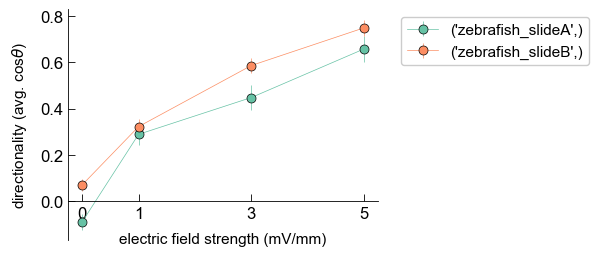

In [209]:
fig, ax = plt.subplots(1,1,figsize = (4,3))

for g, _d in df.groupby(['celltype']):
    print(g)

    E_val = []
    rad_cos_mean = []
    rad_cos_err = []

    for E, d in _d.groupby('E_V_cm'):
        rad = []
        dx = []
        dy = []
        d = d.replace([np.inf, -np.inf], np.nan)
        d = d.dropna()

        for cell, d_ in d.groupby(['cell', 'trial', 'user', 'position', 'date']):
            cells_ = dict_test[(cell[1], cell[2], g[0], cell[3])][EF_dict[E]]
            if cell[1] == 0:
                continue
            if cell[0] not in cells_:
                continue

            
            d_ = d_.replace([np.inf, -np.inf], np.nan)
            d_ = d_.dropna()
            if len(d_.frame.unique()) != len(np.arange(d_.frame.min(), d_.frame.max()+1)):
                continue

            for frame in d_.frame.unique()[:-3]:
                #print(d_[d_.frame==frame + 1].x.values)
                dx2 = d_[d_.frame==frame + 2].x.values[0] - d_[d_.frame==frame].x.values[0]
                dy2 = d_[d_.frame==frame + 2].y.values[0] - d_[d_.frame==frame].y.values[0]
    
                rad = np.append(rad, angle_between([dx2, dy2], [1, 0]))
        
        
        rad_cos = np.cos(rad)
        rad_cos = rad_cos[~np.isnan(rad_cos)]
        #print(rad_cos)

        # Compute replicates
        bs_reps = np.array(
            [draw_bs_rep(rad_cos, np.mean, rg) for _ in range(n_reps)]
            )

        # Compute the confidence interval
        conf_int = np.percentile(bs_reps, [2.5, 97.5])
        
        E_val = np.append(E_val, E)
        rad_cos_mean = np.append(rad_cos_mean, np.mean(rad_cos))
        rad_cos_err = np.append(rad_cos_err, np.array(np.mean(rad_cos) - conf_int[0], conf_int[1] - np.mean(rad_cos)))
        print(rad_cos_mean)
    gene = g
#     ax.errorbar
    print([float(e) for e in E_val], rad_cos_mean)
    ax.errorbar([float(e) for e in E_val], rad_cos_mean, 
                yerr = rad_cos_err,
               color = color_dict[g[0]], marker ='o', markersize= 6.5, linewidth = 0.5,
                linestyle = '-', label = g, markeredgecolor = 'k',
               markeredgewidth = 0.5)


legend_without_duplicate_labels(ax)
ax.spines['bottom'].set_position(('data', 0))
# ax.set_ylim(-0.1, 1)
# ax.set_yticks([0,0.5,1.0])
# ax.set_xticks([0,1, 2, 3, 4, 5])
ax.set_xticks([0,1, 3, 5])

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
ax.set_ylabel(r'directionality (avg. cos$\theta$)')
ax.set_xlabel('electric field strength (mV/mm)')








## compasss autocorrelation

In [202]:
###############################
# Autocorrelation calculation
###############################

def non_overlapping_normalized_autocorrelation(signal):
    """
    Calculate the non-overlapping normalized autocorrelation of a 1D signal.
    
    Parameters:
    signal (np.ndarray): Input 1D signal.
    
    Returns:
    np.ndarray: Non-overlapping normalized autocorrelation values.
    """
    n = len(signal)
    autocorrelation = np.zeros(n)
    
    for lag in range(n):
        sum_product = 0
        count = 0
        for i in range(0, n - lag, lag + 1):
            sum_product += signal[i] * signal[i + lag]
            count += 1
        
        if count > 0:
            # Normalizing with respect to the sum of squares for lag 0
            normalization_factor = np.sqrt(np.sum(signal[:n - lag:lag + 1] ** 2) * np.sum(signal[lag:n:lag + 1] ** 2))
            autocorrelation[lag] = sum_product / normalization_factor if normalization_factor != 0 else 0
    
    return autocorrelation
    
    
    
# df_angle_E_3 = pd.DataFrame()

# for g, d_ in df.groupby(['celltype', 'E_V_cm', 'date', 'trial', 'user', 'position', 'cell']):
#     d_.frame = d_.frame - d_.frame.min()
    
#     if len(np.arange(d_.frame.min(), d_.frame.max())) + 1 != len(d_.frame.unique()):
#         continue
#     else:
#         # Iterate over frames with a step size of 3
#         for t in np.arange(d_.frame.min() + 3, d_.frame.max() + 1, 3):
#             if (t - 3) < d_.frame.min():  # Ensure there's enough data for the intervals
#                 continue
            
#             vec_t1 = [d_[d_.frame == t-3].x.values[0] - d_[d_.frame == t].x.values[0],
#                       d_[d_.frame == t-3].y.values[0] - d_[d_.frame == t].y.values[0]]
#             vec_t2 = [3, 0]  # reference vector (magnitude not important)

#             datalist = {'celltype': g[0],
#                         'E_V_cm': g[1],
#                         'date': g[2],
#                         'trial': g[3],
#                         'user': g[4],
#                         'cell': g[6],
#                         'interval': t,
#                         'position': g[5], 
#                         'angle': angle_between(vec_t2, vec_t1),
#                         'cos_angle': np.cos(angle_between(vec_t2, vec_t1))}
#             df_dict = pd.DataFrame([datalist])
#             df_angle_E_3 = pd.concat([df_angle_E_3, df_dict], ignore_index=True)

df_angle_E_2 = pd.DataFrame()

for g, d_ in df.groupby(['celltype', 'E_V_cm', 'date', 'trial', 'user', 'position', 'cell']):
    d_.frame = d_.frame - d_.frame.min()
    if len(d_.frame.unique()) <=10:
        continue
    if len(np.arange(d_.frame.min(), d_.frame.max())) + 1 != len(d_.frame.unique()):
        continue
    else:
        # Iterate over frames with a step size of 2
        for t in np.arange(d_.frame.min() + 2, d_.frame.max() + 1, 2):
            if (t - 2) < d_.frame.min():  # Ensure there's enough data for the intervals
                continue
            
            vec_t1 = [d_[d_.frame == t-2].x.values[0] - d_[d_.frame == t].x.values[0],
                      d_[d_.frame == t-2].y.values[0] - d_[d_.frame == t].y.values[0]]
            vec_t2 = [2, 0]  # reference vector (magnitude not important)

            datalist = {'celltype': g[0],
                        'E_V_cm': g[1],
                        'date': g[2],
                        'trial': g[3],
                        'user': g[4],
                        'cell': g[6],
                        'interval': t,
                        'position': g[5], 
                        'angle': angle_between(vec_t2, vec_t1),
                        'cos_angle': np.cos(angle_between(vec_t2, vec_t1))}
            df_dict = pd.DataFrame([datalist])
            df_angle_E_2 = pd.concat([df_angle_E_2, df_dict], ignore_index=True)


/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encountered in divide
  return vector / np.linalg.norm(vector)
/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encountered in divide
  return vector / np.linalg.norm(vector)
/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encountered in divide
  return vector / np.linalg.norm(vector)
/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encountered in divide
  return vector / np.linalg.norm(vector)
/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encountered in divide
  return vector / np.linalg.norm(vector)
/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encount

In [203]:
df_angle_E_2.interval.unique()
# df_angle_E_3.celltype.unique()

array([ 2,  4,  6,  8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28])

('zebrafish_slideA', np.int64(0))
(197,)
[1.         0.35848309 0.24672943 0.07614213 0.0964467  0.03553299]
('zebrafish_slideA', np.int64(1))
(177,)
[1.         0.36176448 0.27253547 0.24293785 0.15254237 0.11864407]
('zebrafish_slideA', np.int64(3))
(152,)
[1.         0.39067454 0.32638114 0.36842105 0.28947368 0.26315789]
('zebrafish_slideA', np.int64(5))
(125,)
[1.         0.36452297 0.36208402 0.376      0.296      0.28      ]
('zebrafish_slideB', np.int64(0))
(272,)
[1.         0.47915344 0.27414819 0.17647059 0.13970588 0.125     ]
('zebrafish_slideB', np.int64(1))
(209,)
[1.         0.44124279 0.31954391 0.23444976 0.18660287 0.17703349]
('zebrafish_slideB', np.int64(3))
(199,)
[1.         0.45948866 0.33858832 0.26633166 0.35678392 0.30653266]
('zebrafish_slideB', np.int64(5))
(166,)
[1.         0.45043923 0.48028286 0.44578313 0.43373494 0.3373494 ]


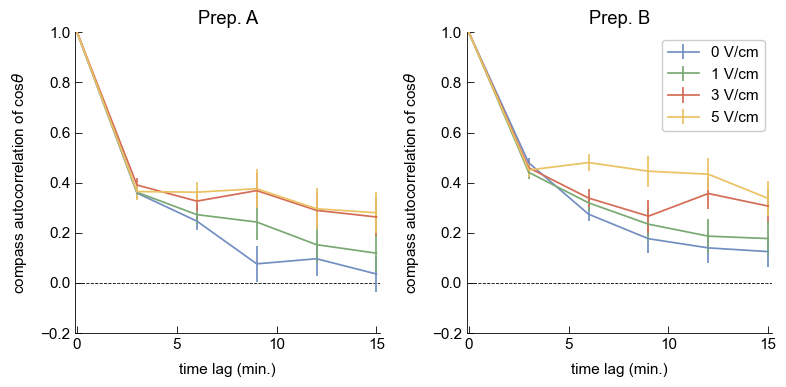

In [204]:
dict_ax = {'zebrafish_slideA': 0, 'zebrafish_slideB': 1}

f, ax = plt.subplots(1,2, figsize = (8,4))

for g, d in df_angle_E_2.groupby(['celltype', 'E_V_cm']):    
    acf_all = np.zeros(6)
    
    for g_, d_ in d.groupby(['date', 'trial', 'user', 'position', 'cell']):
        d_ = d_.sort_values('interval')
        y = d_.cos_angle.values
        #print(len(y))   
        #if np.all([g[1] == '0', g_[1] == '0']):
        #    continue

        # need each array to be same length (take only full length 
        # tracks, or ones missing an interval)
        if len(y) > 5:
            y = y[:6]
        if len(y) != 6:
            continue
        #print(y)
        # if np.any(np.isnan(y)):
        #     continue
            
        #print(y)
        acf = non_overlapping_normalized_autocorrelation(y)  
        if np.any(np.isnan(acf)):
            continue
        acf_all = np.vstack([acf_all, acf])

    acf_all = acf_all[1:,:]
    print(g)
    print(np.mean(acf_all, axis =1).shape)
    print(np.mean(acf_all[:,:6], axis =0))
    ax[dict_ax[g[0]]].errorbar(x = np.arange(6)*3,
                   y = np.mean(acf_all[:,:6], axis =0), 
                   yerr = np.var(acf_all[:,:6], axis =0)/np.sqrt(len(acf_all[:,:6])),
                   label = ''.join([str(g[1]),' V/cm']), zorder = 10, lw = 1.25)
    
# ax.legend()

for ax_ in ax:
    ax_.set_xlim(-0.1, 5*3+0.2)
    ax_.set_ylim(-0.2, 1)
    ax_.hlines(0,0,6*3, zorder = 0, color = 'k', linestyle = '--')
    ax_.set_xlabel('time lag (min.)')
    
    ax_.set_ylabel('compass autocorrelation '
                 r'of cos$\theta$')

# plt.savefig('../../figures/Figure3_supp_autocorr.pdf')

ax[0].set_title('Prep. A')
ax[1].set_title('Prep. B')

plt.tight_layout()
# f.savefig('20241213_truncation_compass.pdf', bbox_inches='tight')
ax[1].legend()


{'zebrafish_TMEM154-KO': 1, 'zebrafish_WT': 0}